# **ECE471 - Homework #1**
**Philip Blumin**

# **Introduction**

The goal was of this project was to construct a machine learning model that predicts the provided NLCD classes. The specifc classes that this assignment focuses on are water, snow/ice, built area, bare, forest, shrub/scrub, grass, crops, and wetlands. For the assignment the professor provided a dataset with 1340 images and targest, as well as some starting code. In the first part of the assignment, this dataset is explored by looking at the geographical spread along with the class distribution. Afterwards, preprocessing was done on the data set and a landcover classification model was created. Various models were experimented with, but all them are done via tensorflow. 

**Testing**

In order to run and test with your own images please refer to the "everything needed to test the program" section. That section has all the code that needs to be run along with testing instructions

**Attachments in folder**

The folder shared with you should have some model and weight files along with this notebook. The files titled finalWeights and finalModel are the ones that should be used when testing images

# **Provided code by professor**

All of the code in this section is what was provided, except with a few modifications that are commented and explained.

In [ ]:
# we will use rasterio to read GeoTIFF files from cloud storage
!pip install rasterio

     |████████████████████████████████| 19.1MB 63.3MB/s 


In [ ]:
# base imports
from glob import glob
import itertools
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
from osgeo import gdal
import pandas as pd
import rasterio
from random import shuffle
import sklearn.metrics as skmetrics
%tensorflow_version 2.x
import tensorflow as tf

# check that a GPU is enabled
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


**Loading in file links**

In [ ]:
# read in the CSV file that contains file links to the entire dataset
dataset_file = 'https://storage.googleapis.com/naip_public/dataset.csv'
df = pd.read_csv(dataset_file)
print(len(df))
df.head(5)

1340


,images,targets
0,landsat:LC08:PRE:TOAR_6:125:30.0:12:-1096:2034...,nlcd:land_cover_6:125:30.0:12:-1096:20341.tif
1,landsat:LC08:PRE:TOAR_6:125:30.0:15:-998:20492...,nlcd:land_cover_6:125:30.0:15:-998:20492.tif
2,landsat:LC08:PRE:TOAR_6:125:30.0:17:-465:23054...,nlcd:land_cover_6:125:30.0:17:-465:23054.tif
3,landsat:LC08:PRE:TOAR_6:125:30.0:11:962:27264.tif,nlcd:land_cover_6:125:30.0:11:962:27264.tif
4,landsat:LC08:PRE:TOAR_6:125:30.0:16:756:27812.tif,nlcd:land_cover_6:125:30.0:16:756:27812.tif


In [ ]:
# use these as base directories for reading the dataset from cloud storage
image_base = 'https://storage.googleapis.com/naip_public/images'
target_base = 'https://storage.googleapis.com/naip_public/targets_v2'

In [ ]:
# load in file links from cloud storage
samples = list()
for idx, row in df.iterrows():
  image_file = os.path.join(image_base, row['images'])
  target_file = os.path.join(target_base, row['targets'])

  samples.append((image_file, target_file))

with rasterio.open(samples[0][0]) as src:
  img = src.read()

with rasterio.open(samples[0][1]) as src:
  tgt = src.read()

print(img.shape)
print(tgt.shape)
print(len(samples))

(10, 256, 256)
(1, 256, 256)
1340


**Visualization**

In [ ]:
# NLCD color scheme
nlcd_color_mapping = {
    11: (70, 107, 159),
    12: (209, 222, 248),
    21: (222, 197, 255),
    22: (217, 146, 130),
    23: (235, 0, 0),
    24: (171, 0, 0),
    31: (179, 172, 159),
    41: (104, 171, 95),
    42: (28, 95, 44),
    43: (181, 197, 143),
    52: (204, 184, 121),
    71: (223, 223, 194),
    81: (220, 217, 57),
    82: (171, 108, 40),
    90: (184, 217, 235),
    95: (108, 159, 184),
}

# NLCD class mapping
nlcd_name_mapping = {
    11: 'Open Water',
    12: 'Perennial Ice/Snow',
    21: 'Developed, Open Space',
    22: 'Developed, Low Intensity',
    23: 'Developed, Medium Intensity',
    24: 'Developed, High Intensity',
    31: 'Barren Land',
    41: 'Deciduous Forest',
    42: 'Evergreen Forest',
    43: 'Mixed Forest',
    52: 'Shrub/Scrub',
    71: 'Grassland/Herbaceous',
    81: 'Pasture/Hay',
    82: 'Cultivated Crops',
    90: 'Woody Wetlands',
    95: 'Emergent Herbaceous Wetlands',
}

In [ ]:
# build a matplotlib colormap so we can visualize this data
colors = list()
for idx, class_val in enumerate(nlcd_color_mapping.keys()):
  red, green, blue = nlcd_color_mapping[class_val]

  color_vec = np.array([red/255, green/255, blue/255])
  colors.append(color_vec)

colors = np.stack(colors)
cmap = matplotlib.colors.ListedColormap(colors=colors, N=len(colors))

bounds = list(range(len(colors)))
norm = matplotlib.colors.BoundaryNorm(bounds, len(colors))

In [ ]:
# write a function so that we can display image/target/predictions
def display_image_target(display_list):
  plt.figure(dpi=200)
  title = ['Image', 'Target', 'Prediction']

  for idx, disp in enumerate(display_list):
    plt.subplot(1, len(display_list), idx+1)
    plt.title(title[idx], fontsize=6)
    plt.axis('off')

    if title[idx] == 'Image':
      arr = disp.numpy()
      rgb = np.stack([arr[:, :, 3], arr[:, :, 2], arr[:, :, 1]], axis=-1) / 3000.0
      plt.imshow(rgb)

    elif title[idx] == 'Target':
      tgt = disp.numpy().squeeze()
      plt.imshow(tgt, interpolation='none', norm=norm, cmap=cmap)

    elif title[idx] == 'Prediction':
      #pred = np.argmax(disp, axis=-1) # argmax across probabilities to get class outputs
      pred = disp.numpy().squeeze()
      plt.imshow(pred, interpolation='none', norm=norm, cmap=cmap)

  plt.show()
  plt.close()

**Tensorflow dataset loader**

In [ ]:
def read_sample(data_path: str) -> tuple:
  path = data_path.numpy()
  image_path, target_path = path[0].decode('utf-8'), path[1].decode('utf-8')

  with rasterio.open(image_path) as src:
    img = np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint16)
    #img = img[:,:,:-2] #added this to get rid of the alpha band and cloud mask

  with rasterio.open(target_path) as src:
    tgt = np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint8)

  tgt_out = np.zeros(tgt.shape, dtype=np.uint8)
  for class_val, nlcd_val in enumerate(nlcd_color_mapping.keys()):
    tgt_out[tgt == nlcd_val] = class_val

  return (img, tgt_out)

In [ ]:
@tf.function
def tf_read_sample(data_path: str) -> dict:
  # wrap custom dataloadeer into tensorflow
  [image, target] = tf.py_function(read_sample, [data_path], [tf.uint16, tf.uint8])

  # explicitly set tensor shapes
  image.set_shape((256, 256, 10)) #modified this to 8 cause no more alpha and cloud bands
  target.set_shape((256, 256, 1))

  return {'image': image, 'target': target}

In [ ]:
@tf.function
def load_sample(sample: dict) -> tuple:
  # convert to tf image
  image = tf.image.resize(sample['image'], (256, 256))
  target = tf.image.resize(sample['target'], (256, 256))

  # cast to proper data types
  image = tf.cast(image/3500, tf.float32)
  target = tf.cast(target, tf.uint8)

  return image, target

In [ ]:
def createDs(samples):
  # create tensorflow dataset from file links
  ds = tf.data.Dataset.from_tensor_slices(samples)

  # read in image/target pairs
  ds = ds.map(tf_read_sample, num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # read in as tensors
  ds = ds.map(load_sample, num_parallel_calls=tf.data.experimental.AUTOTUNE)
  return ds

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


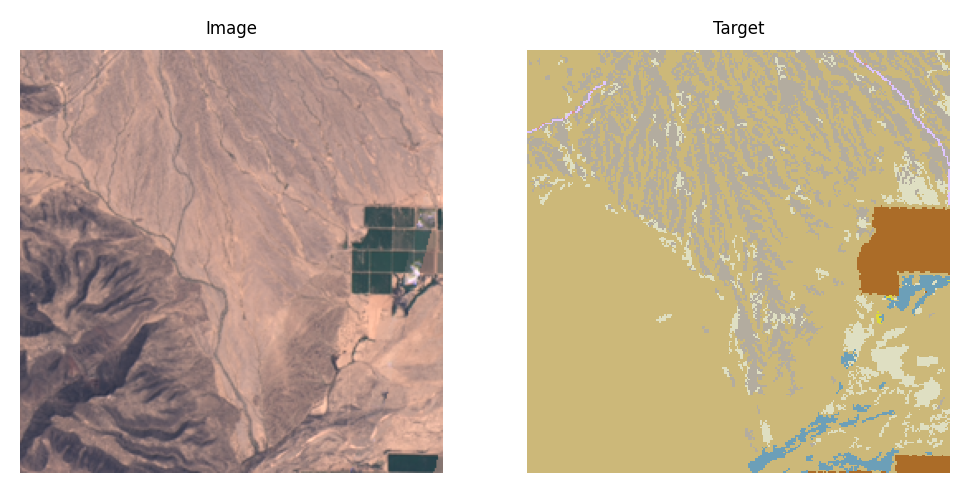

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


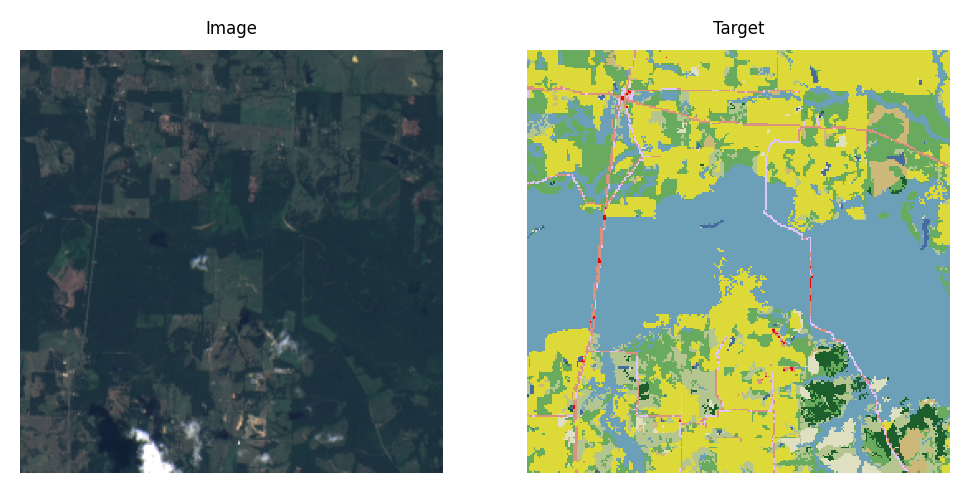

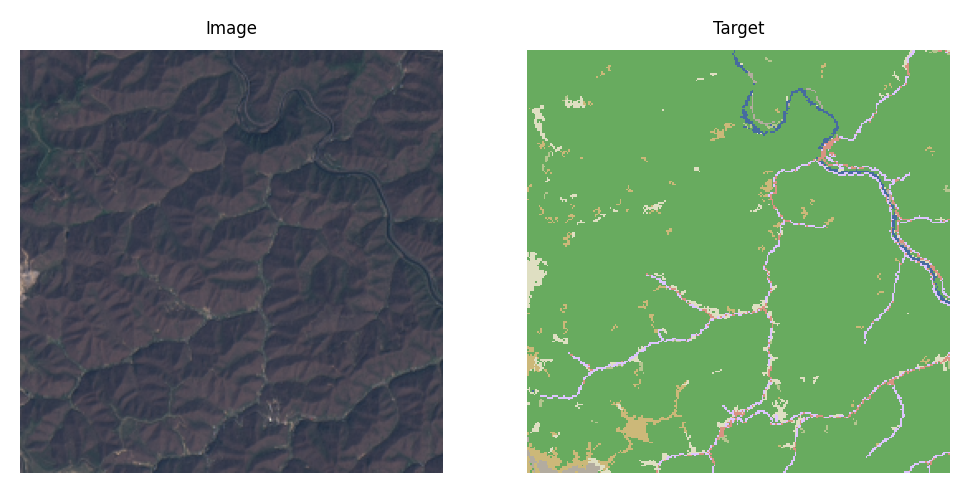

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


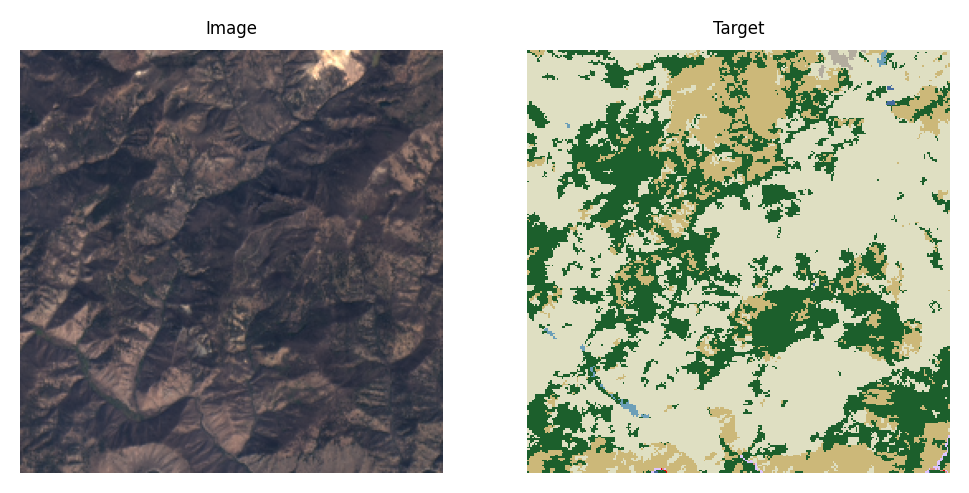

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


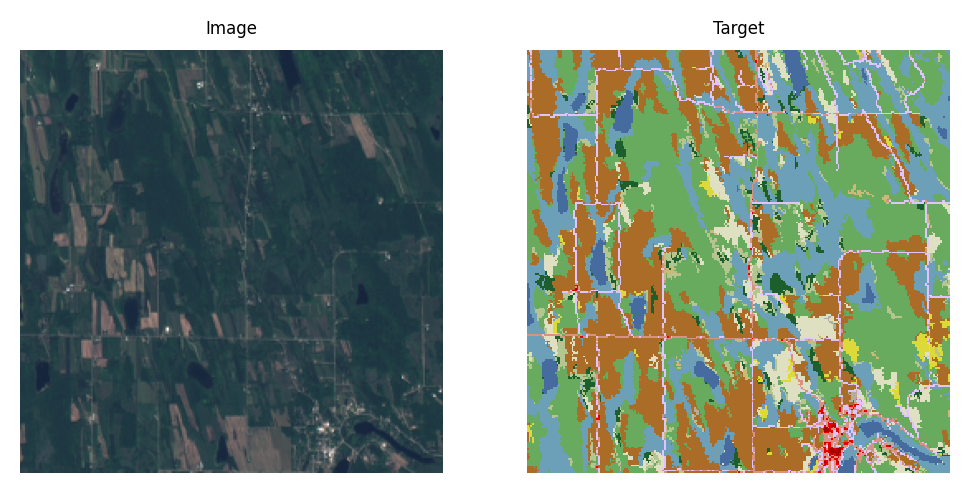

In [ ]:
ds = createDs(samples)
for image, target in ds.take(5):
  display_image_target([image*3500, target])

# **Task 1: Analyze the distribution of the dataset**

For the first part of the analysis I looked at the geographical spread of the data and then I looked the pixel distribution.

To visualize the geographical spread, first I extracted the logitude and latitude for each of the images. Then I appended each of these coordinates to a dataframe. 

In [ ]:
import rasterio.features
df = pd.DataFrame(columns=['longitude', 'latitude'])
for s in range(0, len(samples)):
  if s % 50 == 0:
    print(s)
  with rasterio.open(samples[s][0]) as src:
    img = src.read()
    mask = src.dataset_mask()
    for geom, val in rasterio.features.shapes(mask, transform=src.transform):
      geom = rasterio.warp.transform_geom(
              src.crs, 'EPSG:4326', geom, precision=6)
      longitude = geom['coordinates'][0][0][0]
      latitude = geom['coordinates'][0][0][1]
      coordinates = [longitude, latitude]
      df = df.append({'longitude': longitude,'latitude': latitude}, ignore_index=True)
  
df.head()

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300


,longitude,latitude
0,-113.154410,33.107865
1,-94.970957,33.356009
2,-81.989691,37.525676
3,-114.874937,44.336551
4,-85.314197,45.231860


Above is the cordinate dataframe that was crteated

My first attempt at visualize the spread was to simply scatter plot the coordinates. 

In [ ]:
BBox = ((df.longitude.min(),   df.longitude.max(), df.latitude.min(), df.latitude.max()))

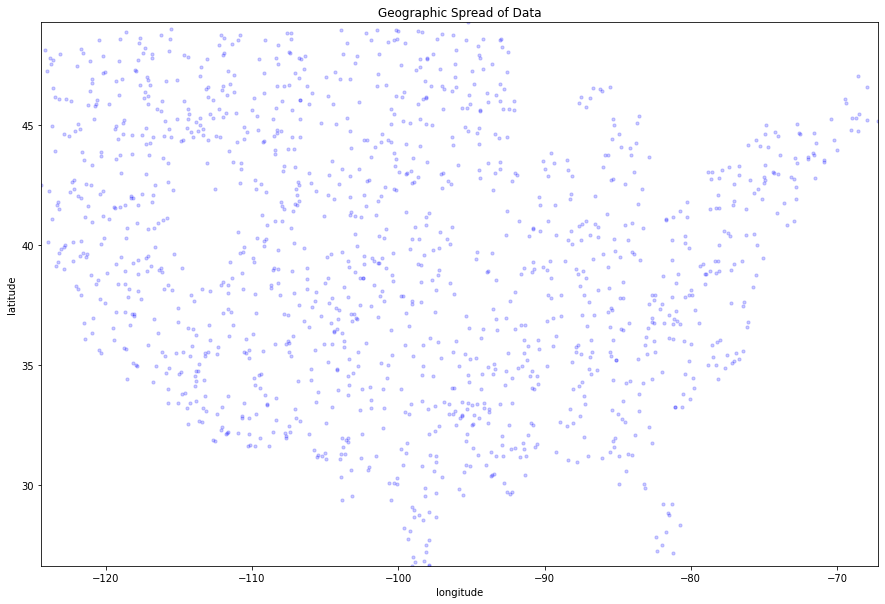

In [ ]:
plt.figure(figsize=(15,10))
plt.scatter(df.longitude, df.latitude, zorder=1, alpha= 0.2, c='b', s=10)
plt.title('Geographic Spread of Data')
plt.xlim(BBox[0],BBox[1])
plt.ylim(BBox[2],BBox[3])
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

From this scatter plot I could tell that the data was only from the US. Next I used folium to more clearly visualize the data, by plotting the points on a map of the US.

In [ ]:
import folium
map = folium.Map(prefer_canvas=True)


In [ ]:
def plotMarker(data):
  folium.CircleMarker(location=[data.latitude, data.longitude], radius=1, weight= 4).add_to(map)


In [ ]:
df.apply(plotMarker, axis = 1)
map.fit_bounds(map.get_bounds())
map

As seen from the map, the data is pretty evenly spread through the US, with the exception of no points around Salt Late City. 

To get the distribution of the classes, I first opened up of each the target files and masked them with the valid pixels based on the cloud and alpha bands. Then for each target I used np.unique to get all the unique values and there counts. Then I compiled the values and counts into a table. I then looped through this table and added each to the class count. In the code block below I commented how I groupped each of the numbers to the classes.

In [ ]:
numOfWater = 0 #11
numOfIce = 0 #12
numOfBuildArea = 0 #21,22,23,24
numOfBare = 0 #31
numOfForest = 0 #41,42, 43
numOfScrub = 0 #52
numOfGrass = 0 #71, 81
numOfCrops = 0 #82
numOfWetlands = 0 #90,95

In [ ]:
import numpy.ma as ma
for s in range(0, len(samples)):
  with rasterio.open(samples[s][0]) as src:
    img = src.read()

  with rasterio.open(samples[s][1]) as src:
    tgt = src.read()
    
  if s % 50 == 0:
    print(s)
  alphaArray = img[-1]
  alphaArray[alphaArray == 65535] = 0
  alphaArray[alphaArray != 65535] = 1
  mask = np.logical_or(alphaArray, img[-2])
  maskedTGT = ma.masked_array(tgt, mask=mask)
  unique, counts = np.unique(maskedTGT, return_counts=True)
  countTable = np.asarray((unique, counts)).T
  for i, j in countTable:
    if i == 11:
      numOfWater += j
    elif i == 12: 
      numOfIce += j
    elif i == 21 or i == 22 or i == 23 or i == 24:
      numOfBuildArea += j
    elif i == 31:
      numOfBare += j
    elif i == 41 or i == 42 or i == 43:
      numOfForest += j
    elif i == 52:
      numOfScrub += j
    elif i == 71 or i == 81:
      numOfGrass += j
    elif i == 82:
      numOfCrops += j
    elif i == 90 or i == 95:
      numOfWetlands += j
    else:
      print("not one of the cat: ", i)

Below is the graph for the distribution of the pixels for each Category, as well as a table with the exact values for each category

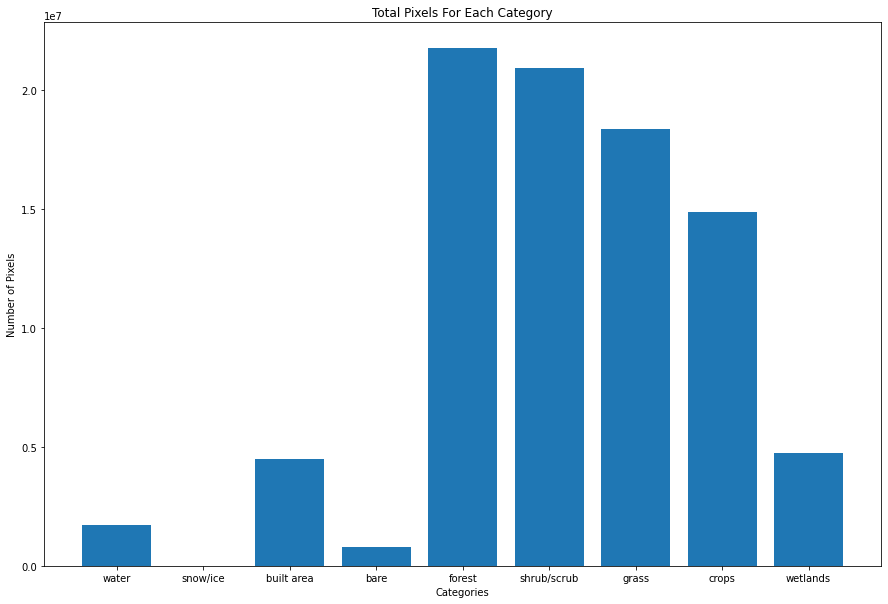

In [ ]:
numbers = [numOfWater, numOfIce, numOfBuildArea, numOfBare, numOfForest, numOfScrub, numOfGrass, numOfCrops, numOfWetlands]
categories = ["water", "snow/ice", "built area", "bare", "forest", "shrub/scrub", "grass", "crops", "wetlands"]
y_pos = np.arange(len(categories))
plt.figure(figsize=(15,10))
# Create bars
plt.bar(y_pos, numbers)

# Create names on the x-axis
plt.xticks(y_pos, categories)

plt.xlabel("Categories")
plt.ylabel("Number of Pixels")
plt.title("Total Pixels For Each Category")
# Show graphic
plt.show()


In [ ]:
pixelFreq = np.asarray((categories, numbers)).T
print(pixelFreq)

[['water' '1714032']
 ['snow/ice' '1922']
 ['built area' '4488216']
 ['bare' '790701']
 ['forest' '21781411']
 ['shrub/scrub' '20945293']
 ['grass' '18388417']
 ['crops' '14870008']
 ['wetlands' '4757760']]


As seen from the pixel distribution the dataset consists of mostly forest, shrub, and grass pixels. This makes sense since the data was taken accross the US as seen from the geographical spread. There are barely any pixels that are classified as snow/ice. This would mean that the images where rarely taken during the winter time.

# **Task 2: Train a landcover classification model**

# **Original Attempt**

In this original attempt I attempted to follow these two tutorials: 

https://www.tensorflow.org/tutorials/images/segmentation

https://idiotdeveloper.com/unet-segmentation-with-pretrained-mobilenetv2-as-encoder/

In this attempt there were a few flaws. One of the biggest one is that I was splitting the data incorrectly. This resulted in an my train, validation, and test overlapped. More about the method is discussed in this section


In [ ]:
!pip install -q git+https://github.com/tensorflow/examples.git


In [ ]:
from tensorflow import keras

In [ ]:
from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
from tensorflow import keras
from IPython.display import clear_output
import matplotlib.pyplot as plt

As mentioned this method of training is not correct. In future attempts the data is split before the tensors are created.

In [ ]:
train_size = int(0.8 * 1340)
val_size = int(0.10 * 1340)
test_size = int(0.10 * 1340)

# ds.shuffle
# train_dataset = ds.take(train_size)

# test_dataset = ds.skip(train_size)

# val_dataset = ds.take(val_size)

# #test_dataset = ds.take(test_size)

ds.shuffle
train_dataset = ds.take(train_size)
test_dataset = ds.skip(train_size)
val_dataset = test_dataset.skip(val_size)
test_dataset = test_dataset.take(test_size)

In [ ]:
len(val_dataset)

134

In [ ]:
samplesize= len(samples)
trainsize=int(0.8*samplesize)
testsize=int(0.1*samplesize)
validationsize=int(0.1*samplesize)


ds1 = ds.shuffle(samplesize)
train_dataset = ds1.take(trainsize)
test_dataset = ds1.skip(trainsize)
val_dataset = test_dataset.skip(validationsize)
test_dataset = test_dataset.take(testsize)

In [ ]:
len(test_dataset)

134

In [ ]:
from tensorflow.keras.layers import UpSampling2D, Input, Concatenate
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


**Callback**

In [ ]:
checkpoint_filepath = '/tmp/checkpoint'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)


In [ ]:
TRAIN_LENGTH = len(ds_train)
BATCH_SIZE = 4
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [ ]:
STEPS_PER_EPOCH

268

OUTPUT_CHANNELS respresents the amount of classes that the model is trying to predict. I experimented with the original 16, but then I found I got better accuracy when grouping some of the classes together to get the original 9 desired.

In [ ]:
OUTPUT_CHANNELS = 9

In [ ]:
OUTPUT_CHANNELS = 16

The code below for creating the model is based on the tutorials discussed early.The MobileNetV2 model is used for the model architecture. In this method, the data is first downsamples 5 times and is later upsampled 4 times.

In [ ]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[256, 256, 8], include_top=False, weights=None)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 128x128
    #'block_2_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/applications/imagenet_utils.py:333: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 8 input channels.
  str(input_shape[-1]) + ' input channels.')


In [ ]:
up_stack = [
    #pix2pix.upsample(512, 16),  # 4x4 -> 8x8
    pix2pix.upsample(256, 16),  # 8x8 -> 16x16
    pix2pix.upsample(128, 16),  # 16x16 -> 32x32
    pix2pix.upsample(64, 16),   # 32x32 -> 64x64
    pix2pix.upsample(32, 16),   # 64x64 -> 128x128
]

In [ ]:
up_stack = [
    #pix2pix.upsample(512, 9),  # 4x4 -> 8x8
    pix2pix.upsample(256, 9),  # 8x8 -> 16x16
    pix2pix.upsample(128, 9),  # 16x16 -> 32x32
    pix2pix.upsample(64, 9),   # 32x32 -> 64x64
    pix2pix.upsample(32, 9),   # 64x64 -> 128x128
]

The unet model below is also from based on what was used in the tutorial. I modified function by adding BatchNormalization in between in layer: x = BatchNormalization()(x)

In [ ]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[256, 256, 8])

  # normalize = tf.keras.layers.BatchNormalization()
  # inputs = normalize(inputs)

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])
    x = BatchNormalization()(x)

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 9, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Model is created and compiled

In [ ]:
model = unet_model(OUTPUT_CHANNELS)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
checkpoint_filepath = '/tmp/checkpoint'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)


Model is fit. For this attempt I tried 20 epochs and the runtime was around 5 hours.

In [ ]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(val_dataset)//BATCH_SIZE//VAL_SUBSPLITS


model_history = model.fit(train_dataset.batch(BATCH_SIZE), epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset.batch(BATCH_SIZE),
                          callbacks=[model_checkpoint_callback])

Epoch 1/20
268/268 [==============================] - 270s 996ms/step - loss: 2.2233 - accuracy: 0.2780 - val_loss: 2.0768 - val_accuracy: 0.2905
Epoch 2/20
268/268 [==============================] - 259s 966ms/step - loss: 1.9986 - accuracy: 0.3218 - val_loss: 1.8128 - val_accuracy: 0.3840
Epoch 3/20
268/268 [==============================] - 259s 966ms/step - loss: 1.9644 - accuracy: 0.3332 - val_loss: 1.7175 - val_accuracy: 0.3839
Epoch 4/20
268/268 [==============================] - 257s 959ms/step - loss: 1.9425 - accuracy: 0.3392 - val_loss: 1.7037 - val_accuracy: 0.3715
Epoch 5/20
268/268 [==============================] - 258s 962ms/step - loss: 1.9258 - accuracy: 0.3436 - val_loss: 1.6886 - val_accuracy: 0.3924
Epoch 6/20
268/268 [==============================] - 262s 976ms/step - loss: 1.9130 - accuracy: 0.3497 - val_loss: 1.6770 - val_accuracy: 0.4117
Epoch 7/20
268/268 [==============================] - 258s 961ms/step - loss: 1.9028 - accuracy: 0.3542 - val_loss: 1.6664 -

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
checkpoint_path = '/content/drive/My Drive/ECE471/Homework2/4_5CheckPoint.ckpt'
model.save_weights(checkpoint_path.format(epoch=0))

Taking a look at how it preformed by taking a look at 50 images from the test dataset

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


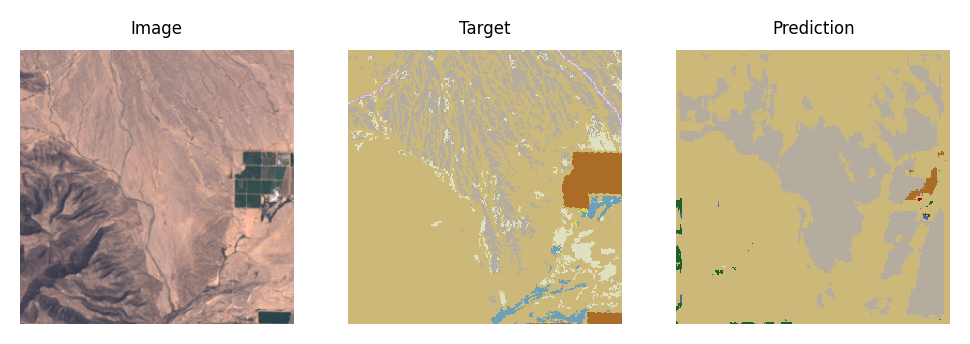

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


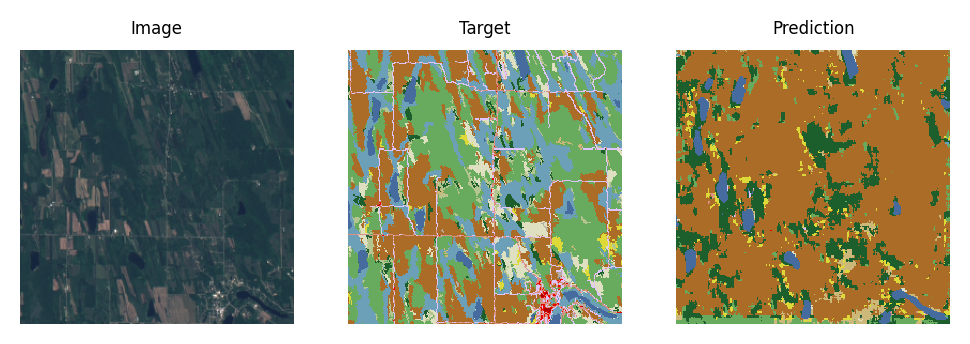

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


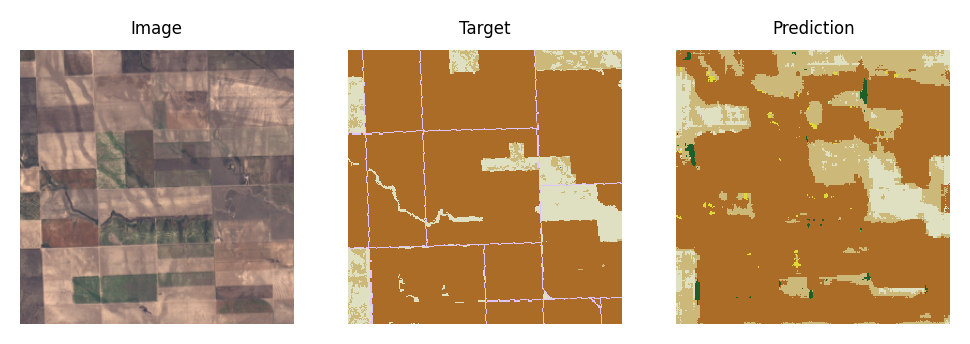

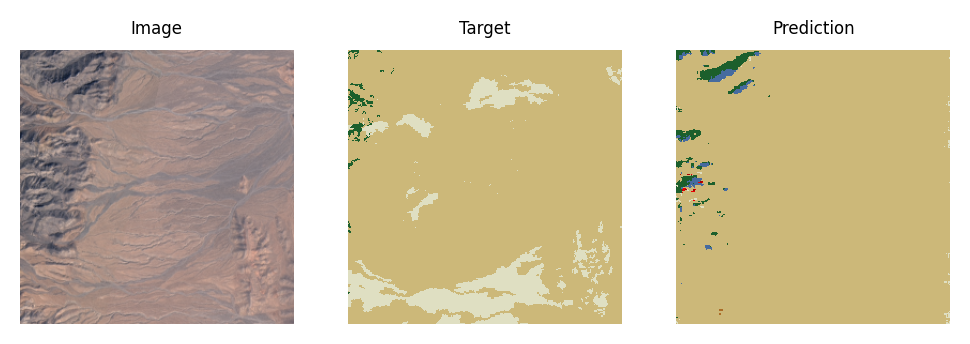

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


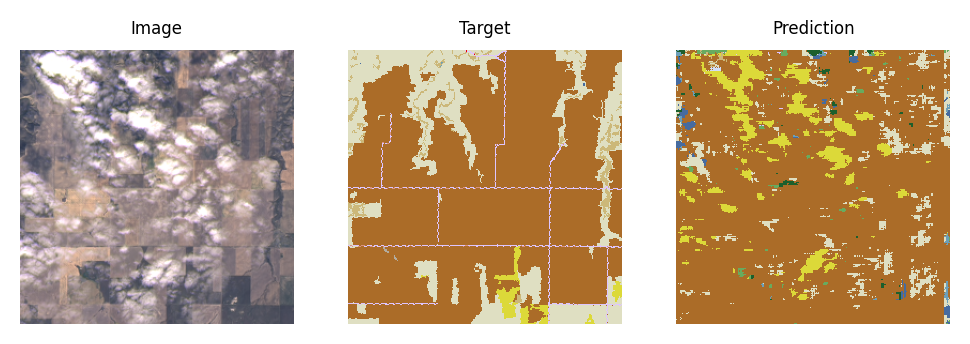

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


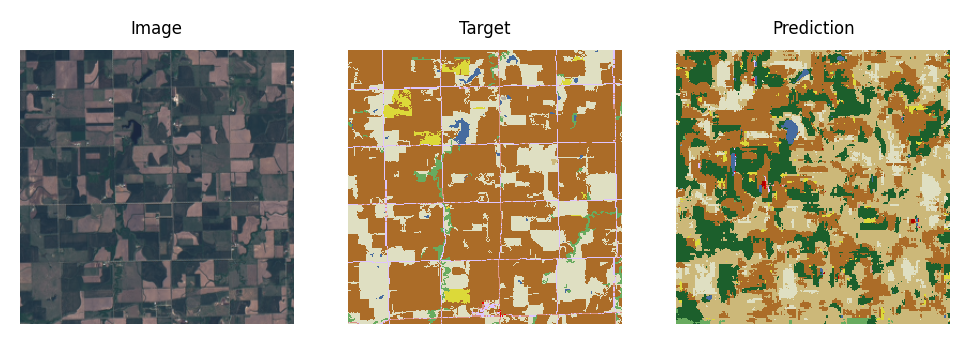

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


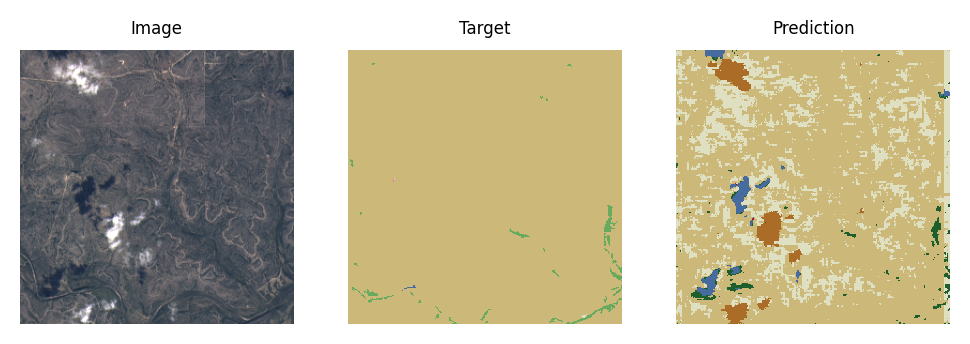

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


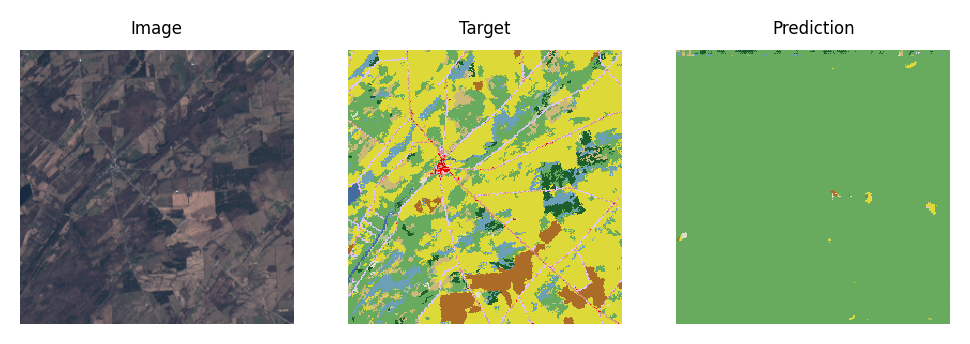

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


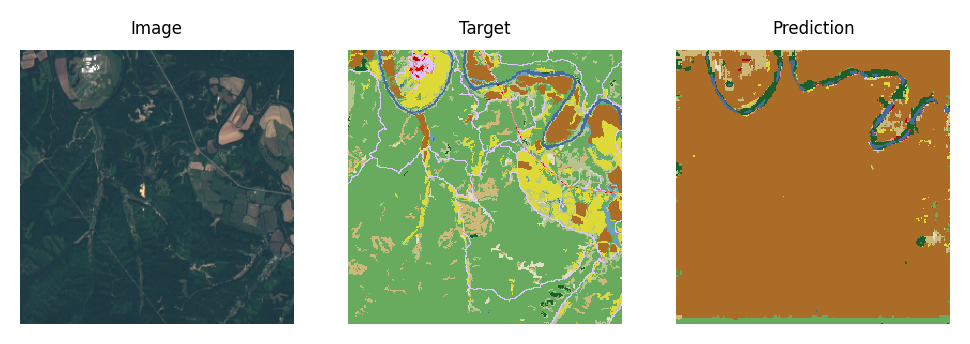

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


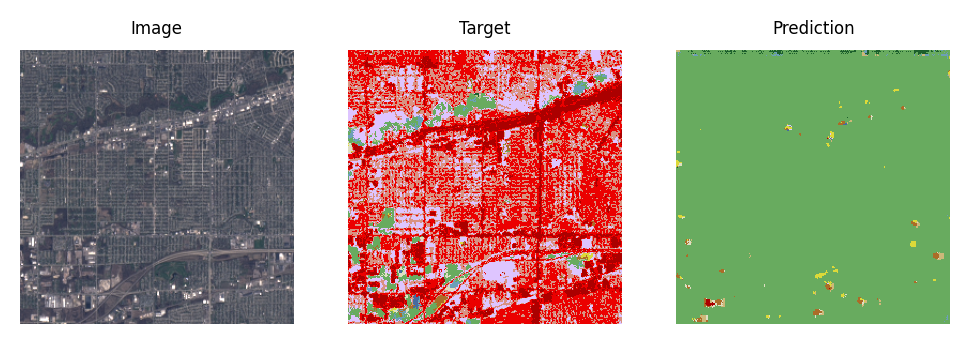

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


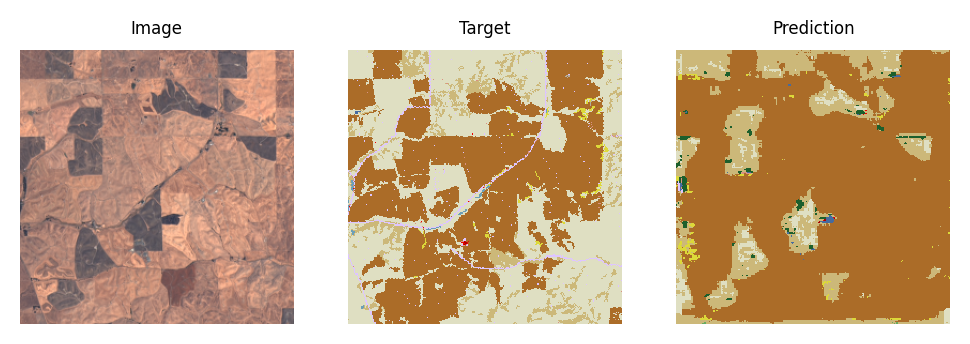

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


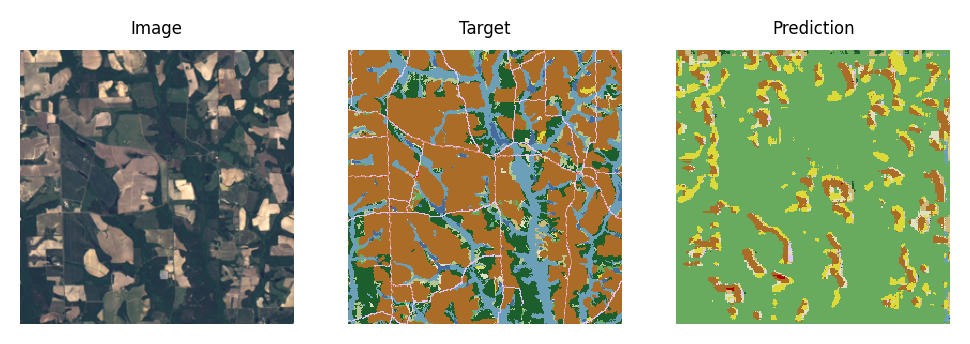

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


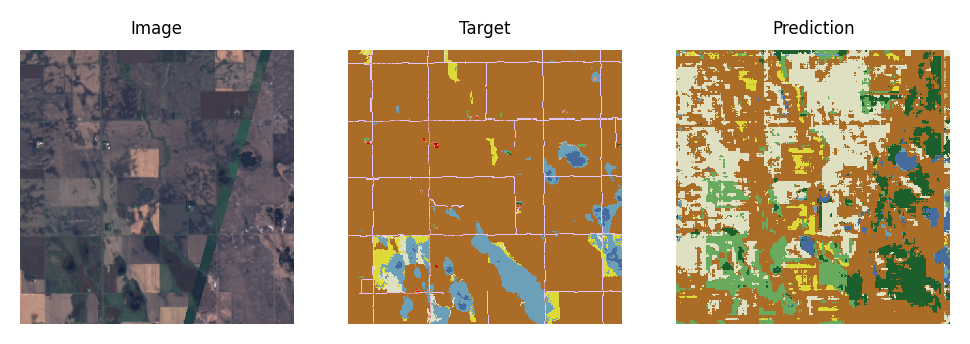

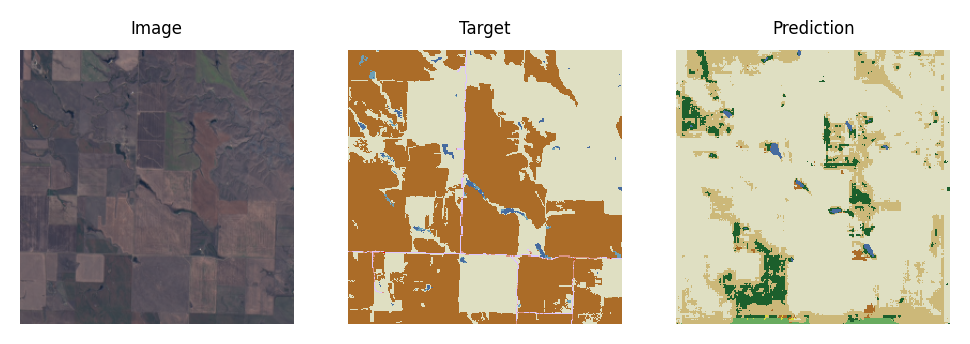

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


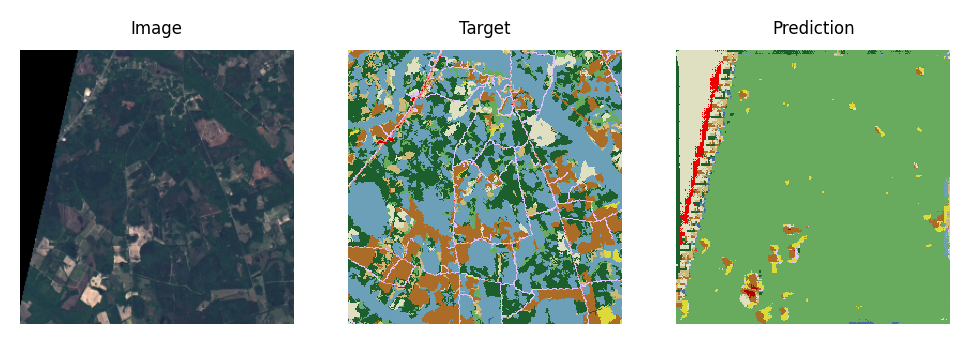

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


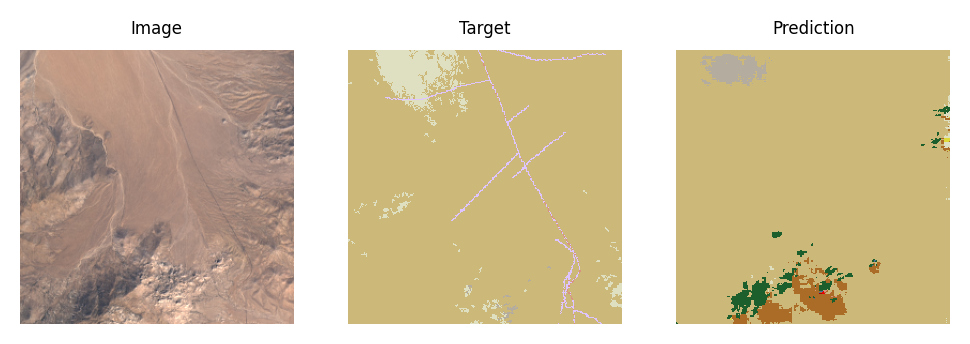

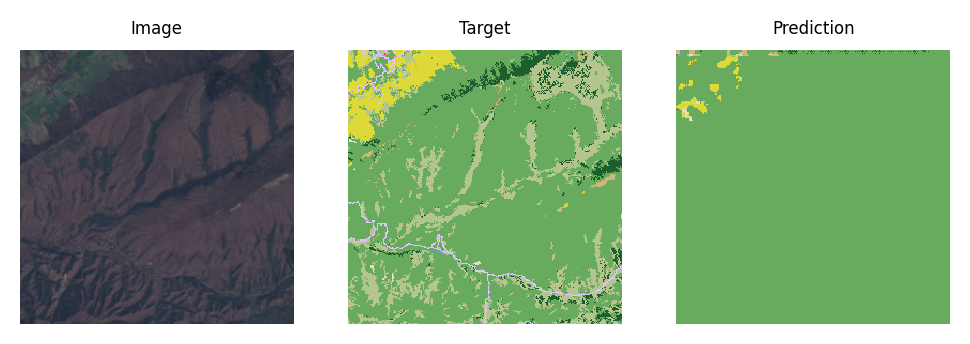

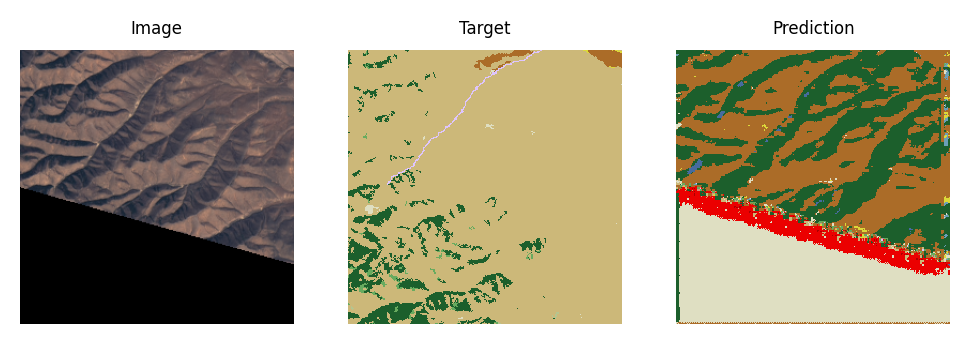

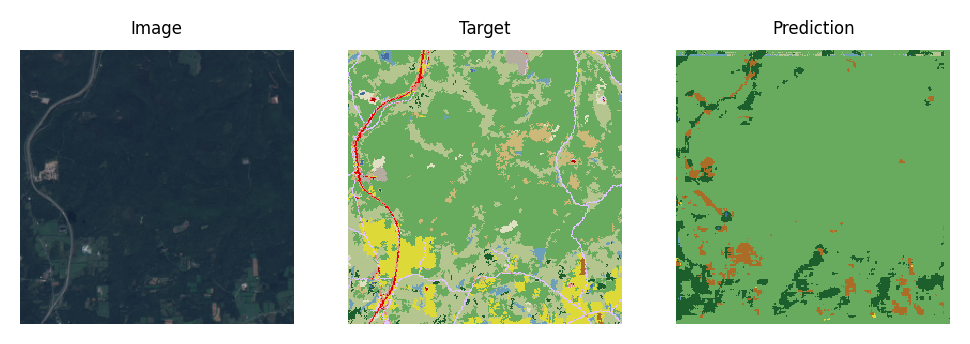

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


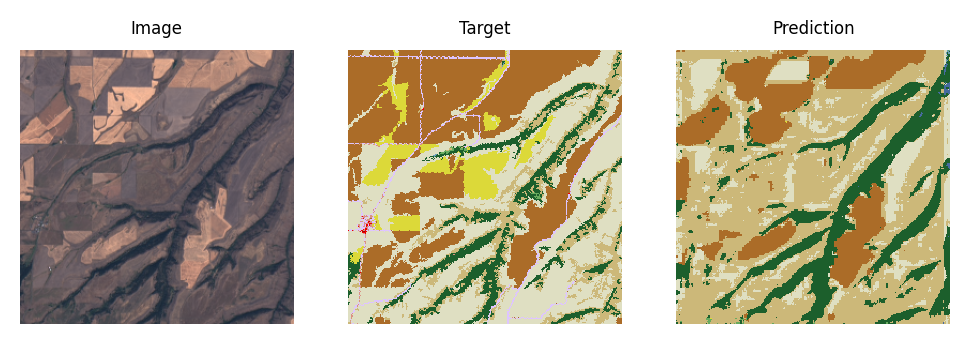

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


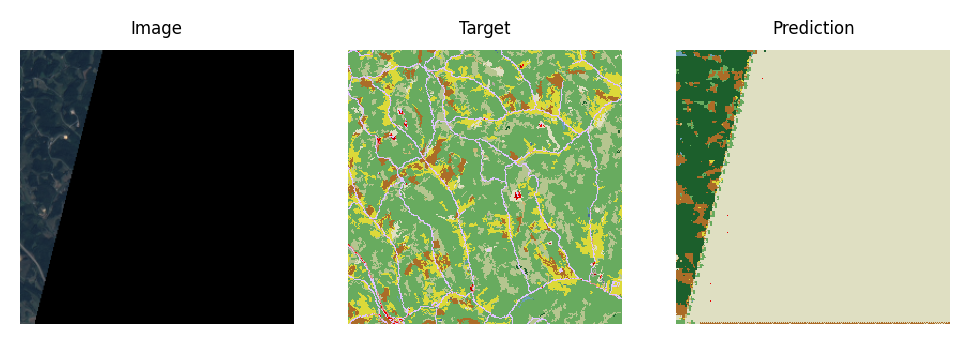

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


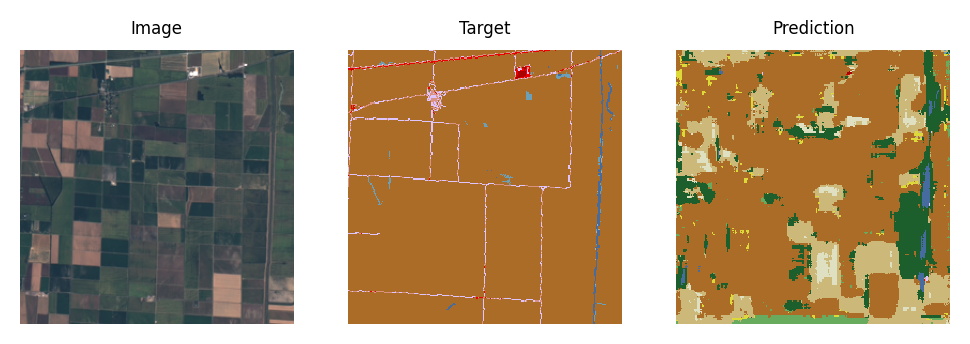

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


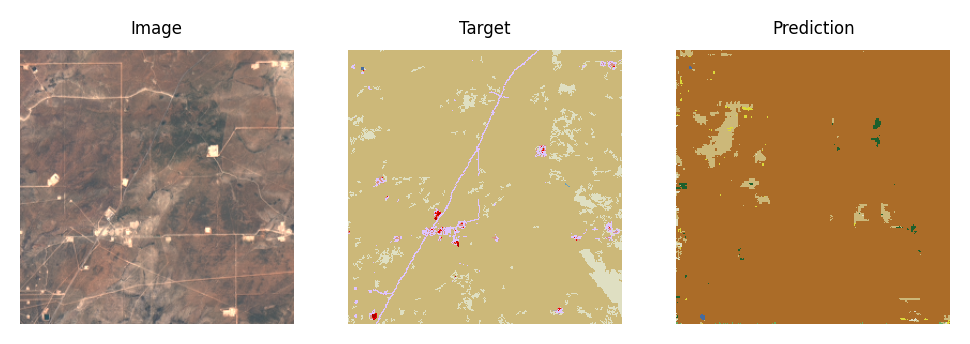

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


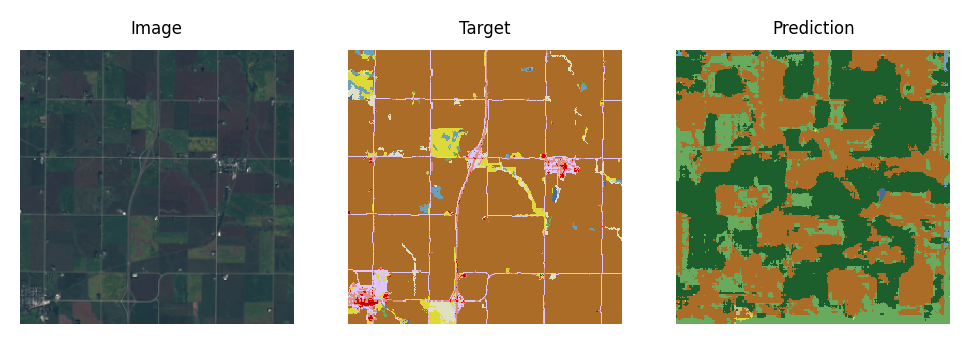

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


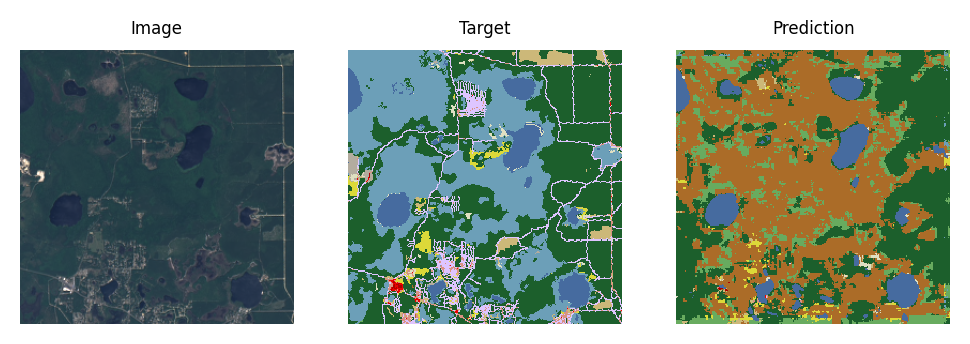

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


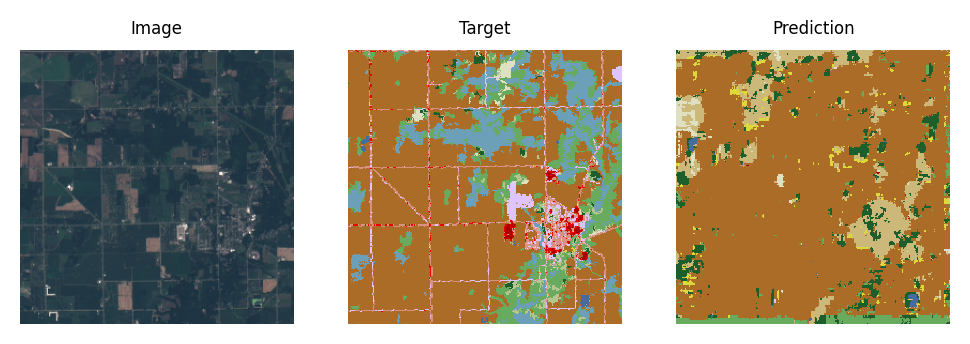

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


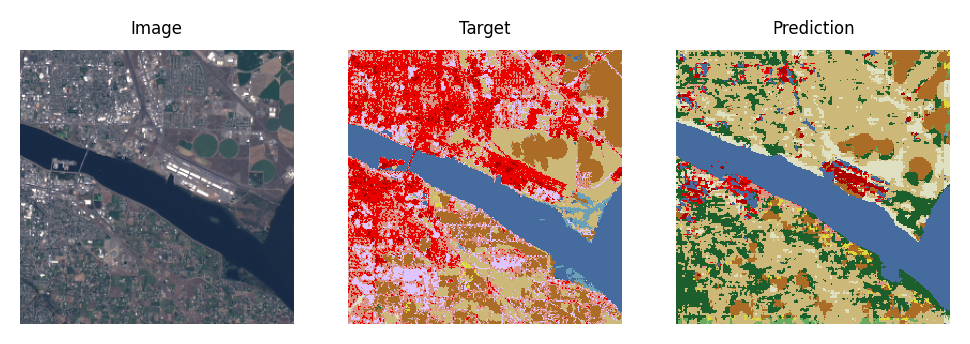

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


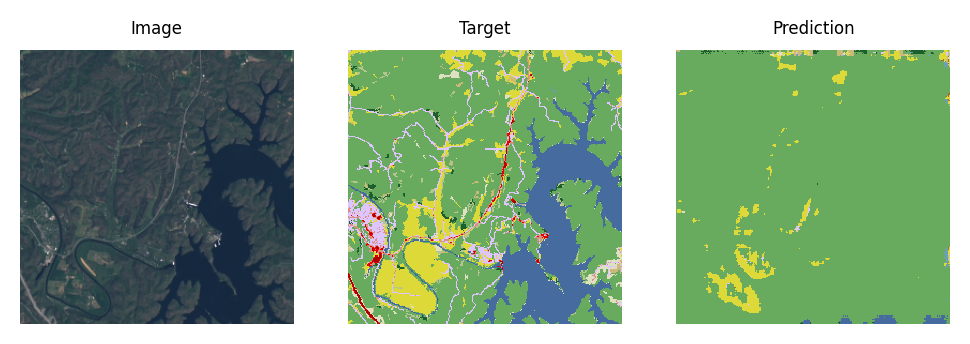

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


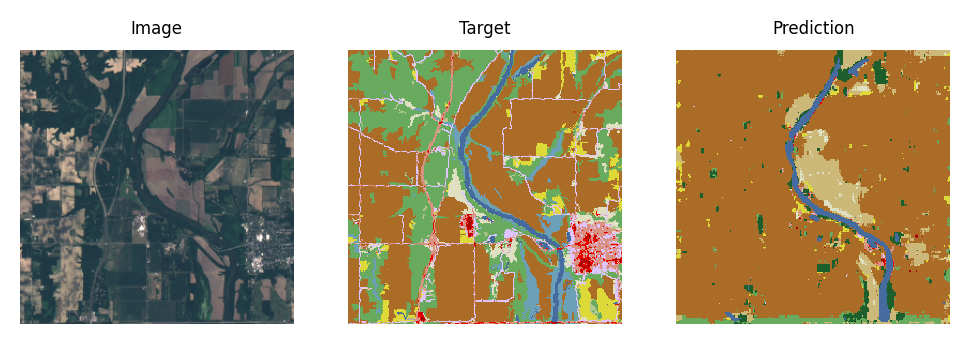

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


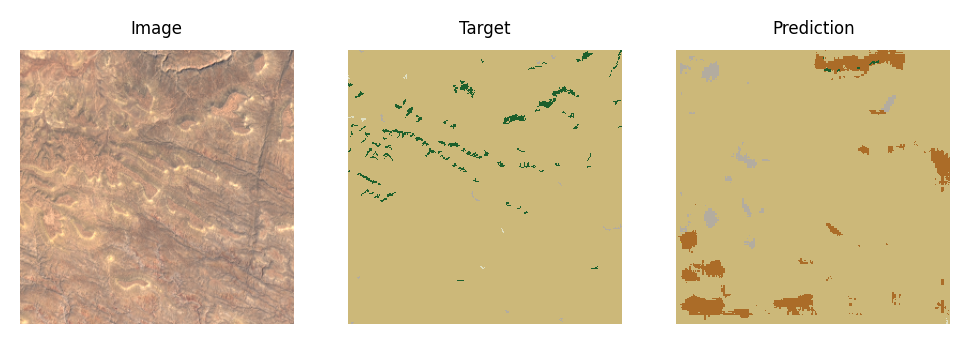

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


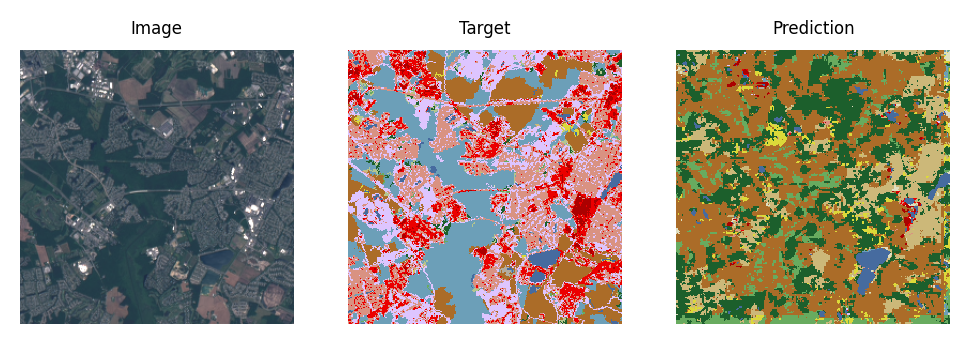

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


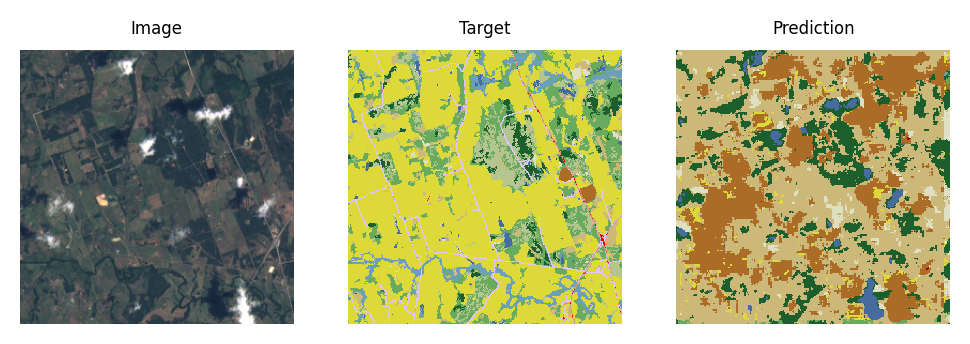

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


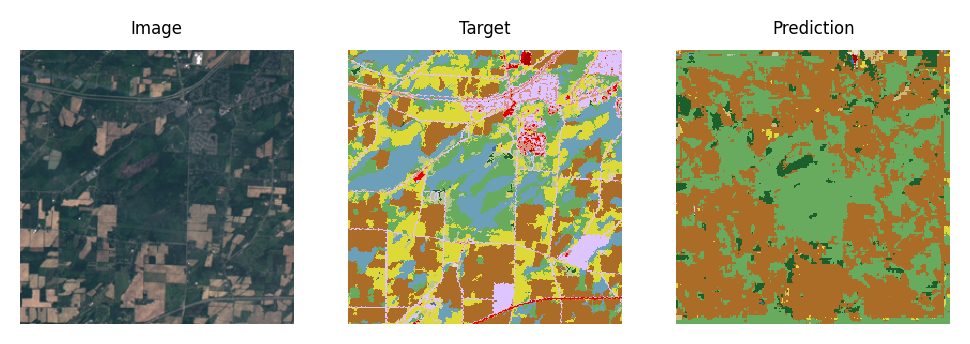

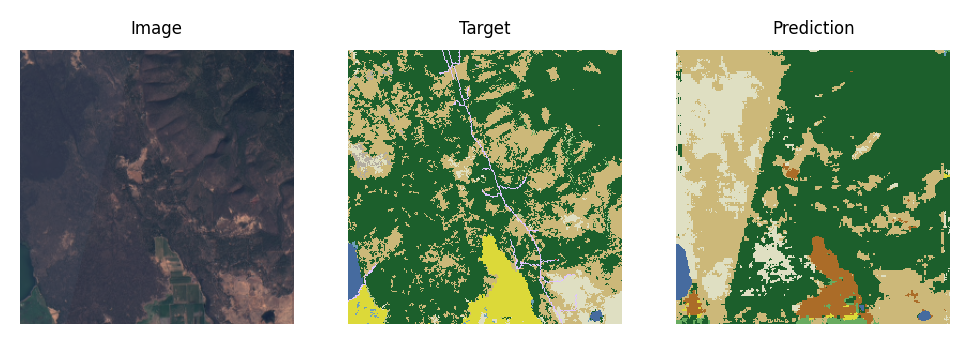

In [ ]:
for image, target in test_dataset.batch(BATCH_SIZE).take(50):
  pred_mask = model.predict(image)
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  #print(pred_mask)
  display_image_target([image[0]*255, target[0],pred_mask[0]])

As seen from the images this first attempt didnt do too bad on some images. It was able to capture streams and lakes pretty well. However, once I ran this I noticed that my test and training images where overlapping because I was splitting incorrectly. This is fixed in the next attempt

In [ ]:

test_steps = (len(test_dataset)//BATCH_SIZE)


model.evaluate(test_dataset.batch(BATCH_SIZE), steps=test_steps)

33/33 [==============================] - 30s 894ms/step - loss: 1.8518 - accuracy: 0.3837


[1.8518002033233643, 0.38371554017066956]

For my first attempt I got 38% accuracy on my "test" data

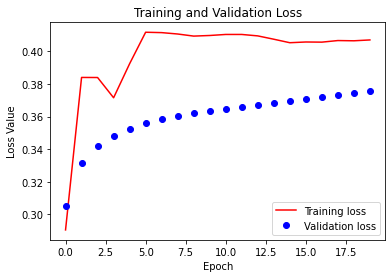

In [ ]:
#loss = model_history.history['loss']
val_accuracy= model_history.history['val_accuracy']
#val_loss = model_history.history['val_loss']
accuracy= model_history.history['accuracy']


epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, val_accuracy, 'r', label='Training loss')
plt.plot(epochs, accuracy, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.legend()
plt.show()

Above is a graph of the training accuracy vs validation accurcy (sorry for the mislabels I noticed after I no longer had access to the model history). The validation is the red line and the training accuracy is the blue dots. As seen from the graph the validation accuracy is alot larger than the training, which raised a huge red flag. This is how I realized that I most likely messed something up when splitting the data. 

# **Improving by grouping and data modification**

After many attempts and different models (I had alot more than the one above, but I deleted so this notebook wouldnt be too long), I kept getting around 25-38%. I discussed with some peers and the professor about possible improvements. One thing that was stressed was that the data needed to be processed better. 

**Normalization**

The first change done in this method is that I normalized the images by dividing by 3500. In the previous method I had normalized by dividing the images by 255. This was incorrect because I forgot that the bands contained unit16 values. Thus, dividing by 255 would result in almost all values being greater than 1. From a previous project done, I looked at the pixel value distribution for each band and I saw that a majority of the pixels revolved around 2000-3000, so dividing by 3500 would be an easy way to normalize. I experimented with dividng by 3000 (as per the professors recommendation) and 255*255, but got the best results when I divided by 3500.

**Removing Alpha and Cloud Mask Bands**

I modified each of the images by removing their cloud mask and alpha bands. The reason this was done is because these two bands have a completely different value distribution than the other bands. The cloud mask band has only 1s and 0s and the alpha band has 0s and 255*255. This modification was suggested by the professor.


**Grouping**

The next modification that was done in this method was that the 16 original provided NLCD categories were grouped into the 9 categories that were displayed in the original bar graph. This in theory should improve the results by alot because there will a lot less classes to classify. This modification was suggested by Mark Koszykowski. 

**Removing Cutoff Images**

This modification was attempted but every time I tried to train on the new dataset after the first epoch tensorflow would spit out an error and end training. The results, I got with just the first epoch where still much better than the previous attempts (~45%). I tried debugging this for a while, but eventually I decided to try the model without removing the cutoff images and got pretty much the same results (after the first epoch at least). Thus, I decided to not do remove the images for this method, but in the future if there were alot more images that were cutoff it would definitly be a good idea to  remove them or modify them somehow. I still provide the code to how I figured out which images were cutoff.

Below is the method I used to figure out which images where cutoff. In order to do this I opened up each image and looked at the alpha band. If the alpha band has any values other than 255 I classified it as invalid.

In [ ]:
validSamples = []
invalidInds = []
for i in range(0, 1340):
  if i % 100 == 0:
    print(i)
  with rasterio.open(samples[i][0]) as src:
    img = np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint8)
    if np.all(img[:,:,-1] == 255):
      validSamples.append((samples[i][0], samples[i][1]))
    else:
      invalidInds.append(i)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300


In [ ]:
invalidInds

[56,
 63,
 68,
 80,
 86,
 107,
 141,
 159,
 202,
 216,
 246,
 434,
 444,
 468,
 493,
 520,
 544,
 553,
 570,
 575,
 584,
 612,
 648,
 773,
 774,
 813,
 852,
 908,
 923,
 948,
 954,
 1155,
 1212,
 1280,
 1296,
 1332,
 1338]

As seen above there were 37 images that where cutoff

In [ ]:
invalidInds = [56,63,68,80,86,107,141,159,202,216,246,434,444,468,493,520,544,553,570,575,584,612,648,773,774,813,852,908,923,948,954,1155,1212,1280,1296,1332,1338] 
  
for ele in sorted(invalidInds, reverse = True):  
    del samples[ele] 

Below is the modified color map to support how I groupped each of the classes

In [ ]:
# NLCD color scheme
nlcd_color_mapping = {
    11: (70, 107, 159),
    12: (209, 222, 248),
    #21: (222, 197, 255),
    #22: (217, 146, 130),
    23: (235, 0, 0),
    #24: (171, 0, 0),
    31: (179, 172, 159),
    #41: (104, 171, 95),
    #42: (28, 95, 44),
    43: (181, 197, 143),
    52: (204, 184, 121),
    71: (223, 223, 194),
    #81: (220, 217, 57),
    82: (171, 108, 40),
    90: (184, 217, 235),
    #95: (108, 159, 184),
}

# NLCD class mapping
nlcd_name_mapping = {
    11: 'Open Water',
    12: 'Perennial Ice/Snow',
    #21: 'Developed, Open Space',
    #22: 'Developed, Low Intensity',
    23: 'Developed, Medium Intensity',
    #24: 'Developed, High Intensity',
    31: 'Barren Land',
    #41: 'Deciduous Forest',
    #42: 'Evergreen Forest',
    43: 'Mixed Forest',
    52: 'Shrub/Scrub',
    71: 'Grassland/Herbaceous',
    #81: 'Pasture/Hay',
    82: 'Cultivated Crops',
    90: 'Woody Wetlands',
    #95: 'Emergent Herbaceous Wetlands',
}

Below is the modified read_sample function. In the function I remove the alpha and cloud mask bands from each of the original images and also group each of the target classes.

In [ ]:
def read_sample(data_path: str) -> tuple:
  path = data_path.numpy()
  image_path, target_path = path[0].decode('utf-8'), path[1].decode('utf-8')

  with rasterio.open(image_path) as src:
    img = np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint16)
    img = img[:,:,:-2] #added this to get rid of the alpha band and cloud mask

  with rasterio.open(target_path) as src:
    tgt = np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint8)
    tgt[tgt == 21] = 23
    tgt[tgt == 22] = 23
    tgt[tgt == 24] = 23
    tgt[tgt == 41] = 43
    tgt[tgt == 42] = 43
    tgt[tgt == 81] = 71
    tgt[tgt == 95] = 90

  tgt_out = np.zeros(tgt.shape, dtype=np.uint8)
  for class_val, nlcd_val in enumerate(nlcd_color_mapping.keys()):
    tgt_out[tgt == nlcd_val] = class_val

  return (img, tgt_out)

In [ ]:
@tf.function
def tf_read_sample(data_path: str) -> dict:
  # wrap custom dataloadeer into tensorflow
  [image, target] = tf.py_function(read_sample, [data_path], [tf.uint16, tf.uint8])

  # explicitly set tensor shapes
  image.set_shape((256, 256, 8))
  target.set_shape((256, 256, 1))

  return {'image': image, 'target': target}

In [ ]:
@tf.function
def load_sample(sample: dict) -> tuple:
  # convert to tf image
  image = tf.image.resize(sample['image'], (256, 256))
  target = tf.image.resize(sample['target'], (256, 256))

  # cast to proper data types
  image = tf.cast(image/(3500), tf.float32)
  target = tf.cast(target, tf.uint8)

  return image, target

As mentioned before the previous method had a problem with the way I split the data. Thanks to a suggesion by the professor, I decided to split to data up from a list before it is processed into rasters. This was done using sklearn's train_test_split. I used 80% for the training data, and 10% for the validation and test data.

In [ ]:
from sklearn.model_selection import train_test_split
sample_train, sample_test = train_test_split(samples, test_size=0.2, random_state = 11)
sample_test, sample_val = train_test_split(sample_test, test_size=0.5, random_state = 11)

In [ ]:
ds_train = createDs(sample_train)
ds_test = createDs(sample_test)
ds_val = createDs(sample_val)

In [ ]:
len(ds_train)

1072

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


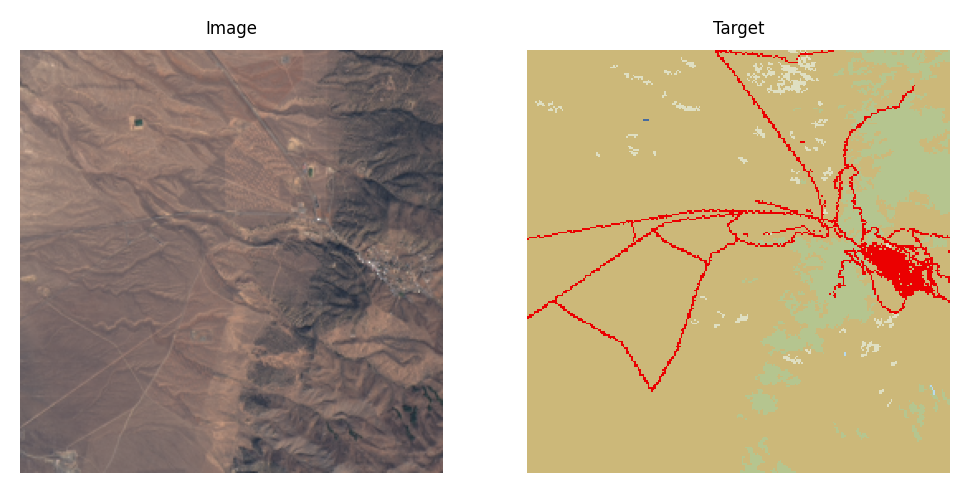

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


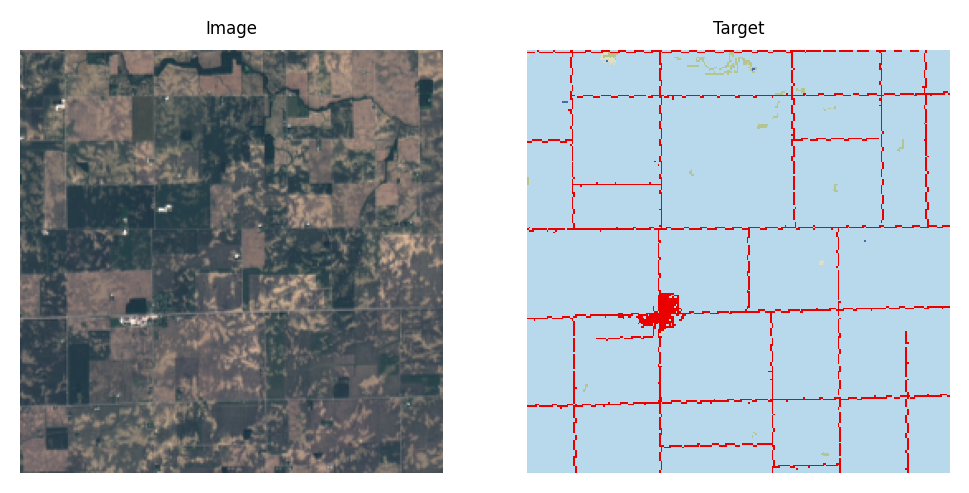

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


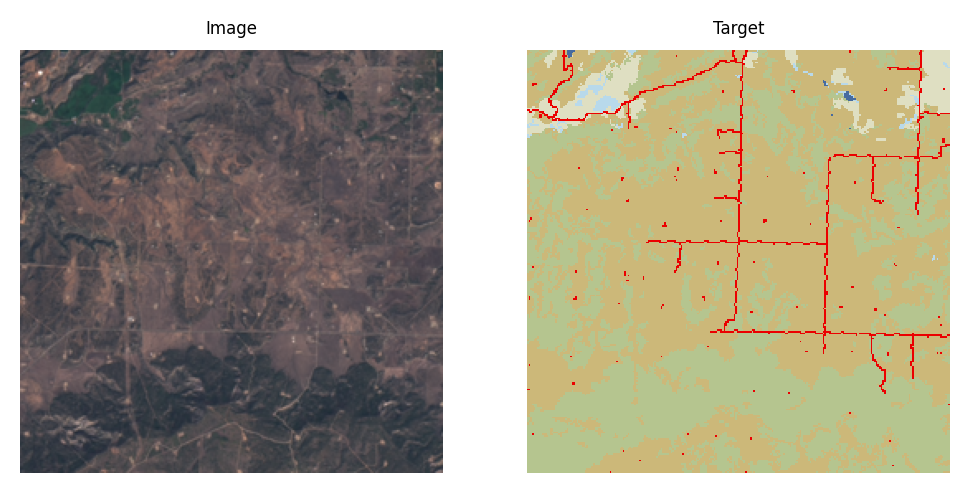

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


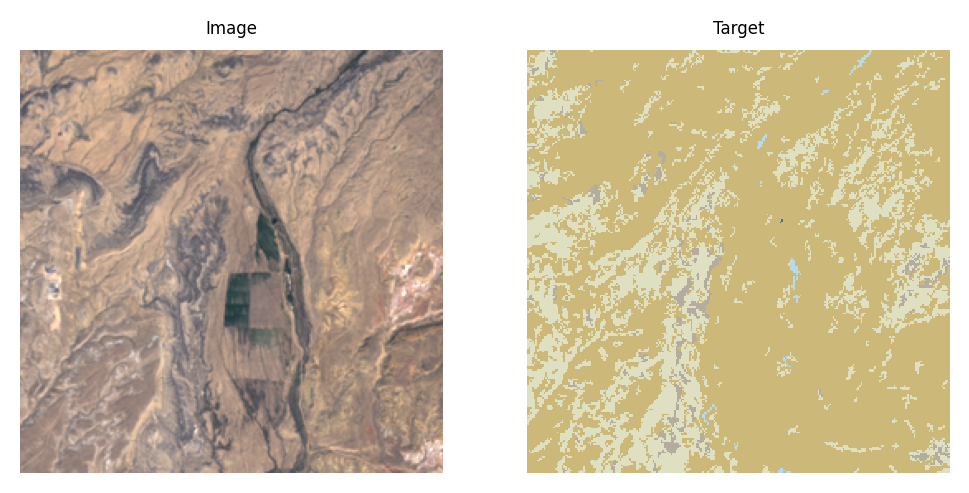

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


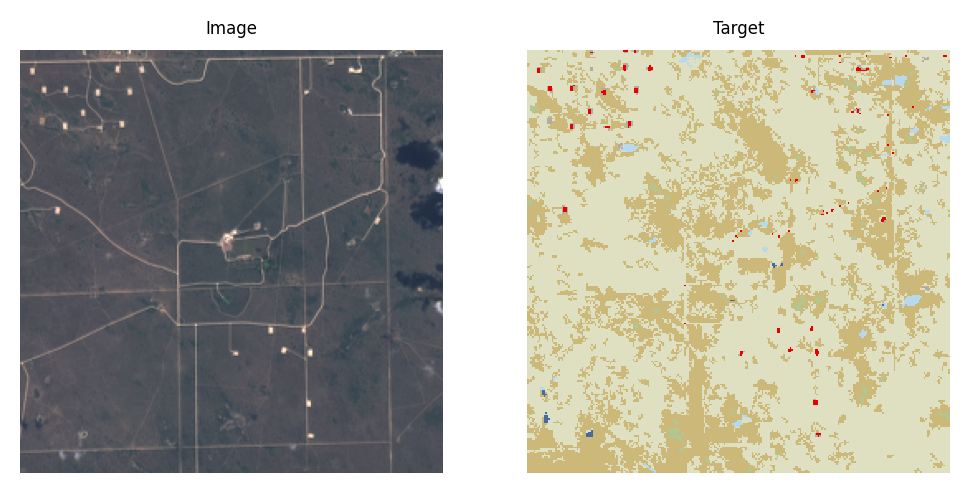

In [ ]:
for image, target in ds_train.take(5):
  display_image_target([image*(3500), target])

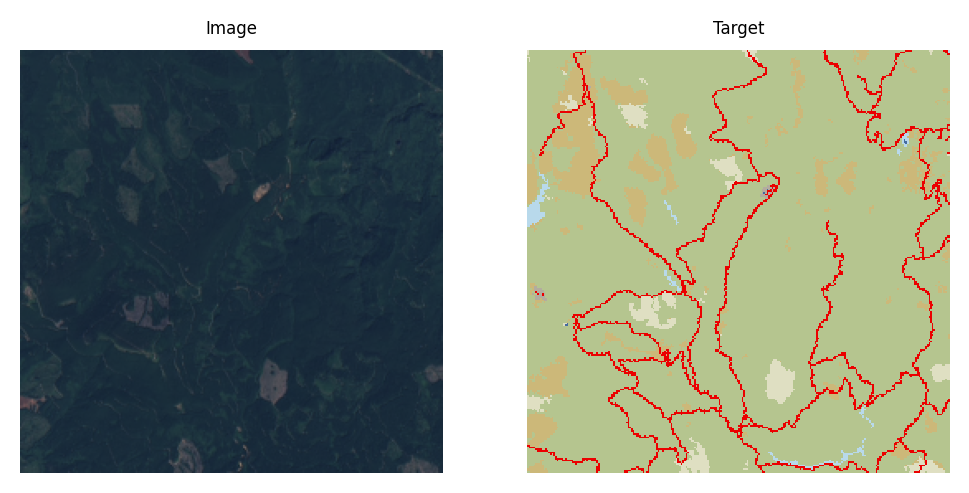

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


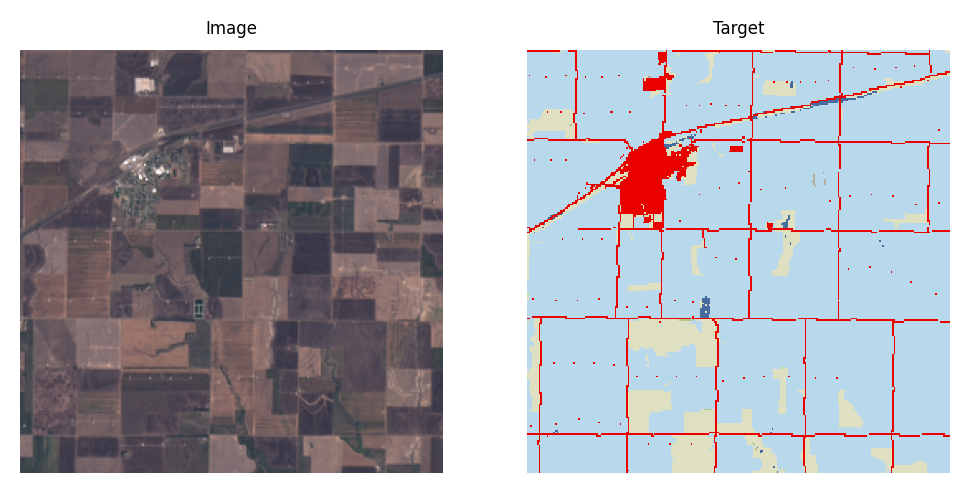

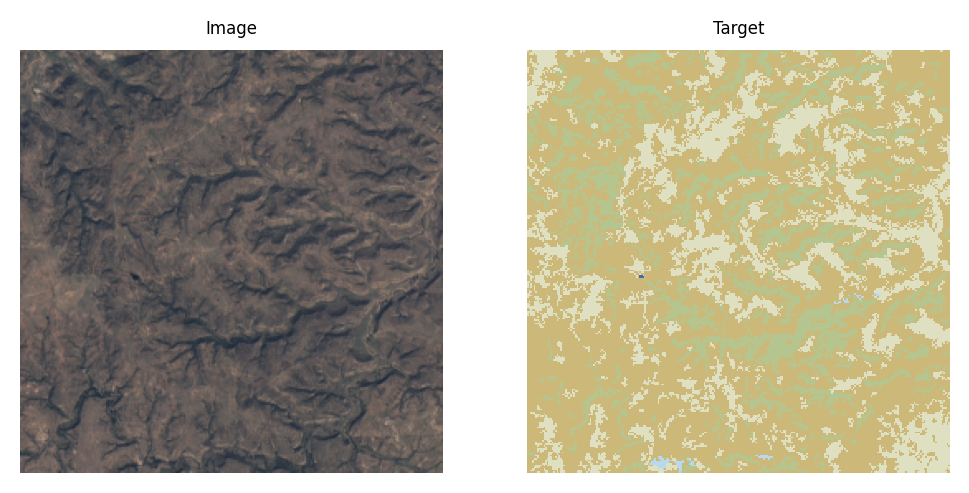

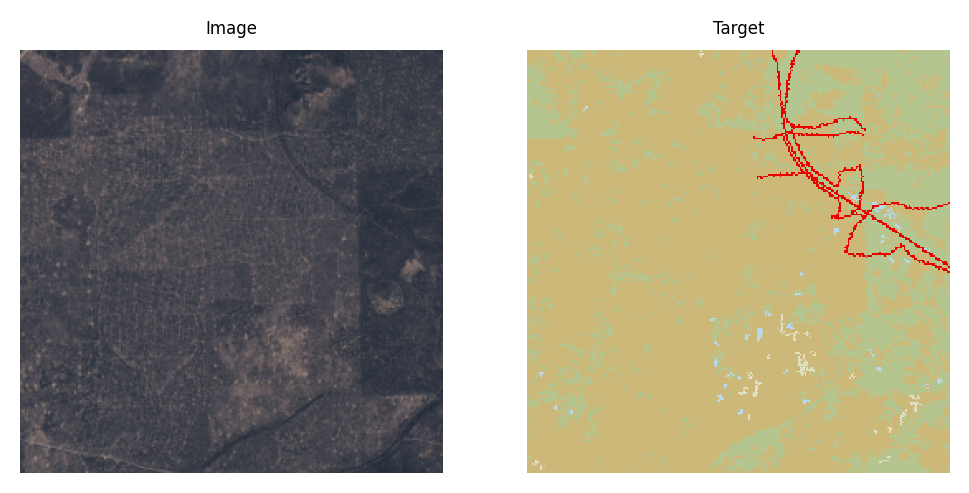

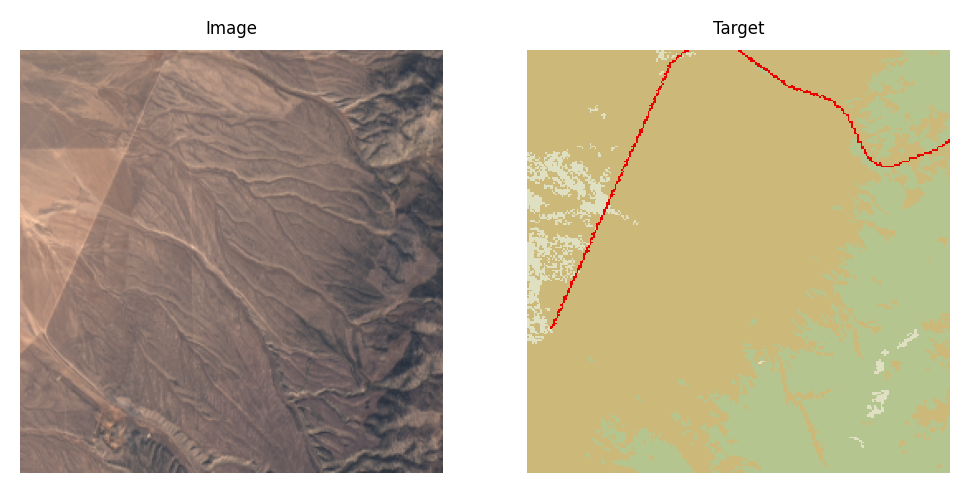

In [ ]:
for image, target in ds_val.take(5):
  display_image_target([image*(3500), target])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


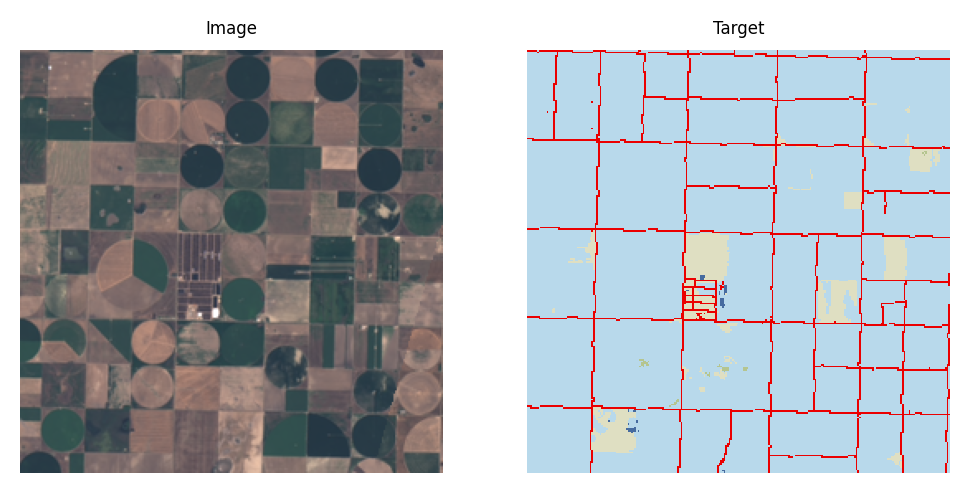

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


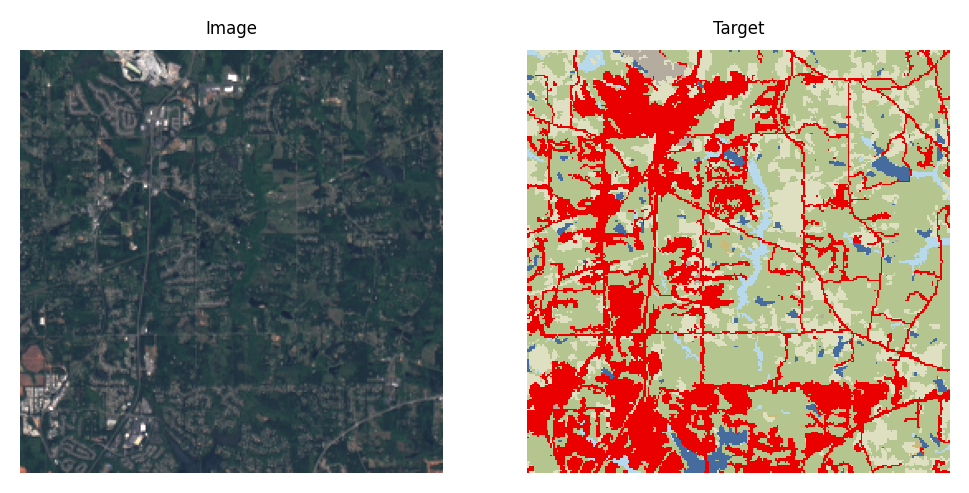

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


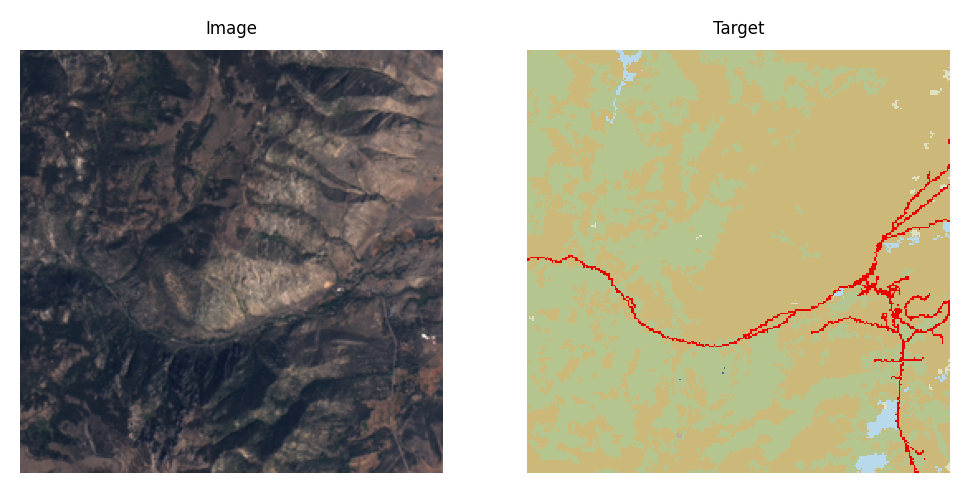

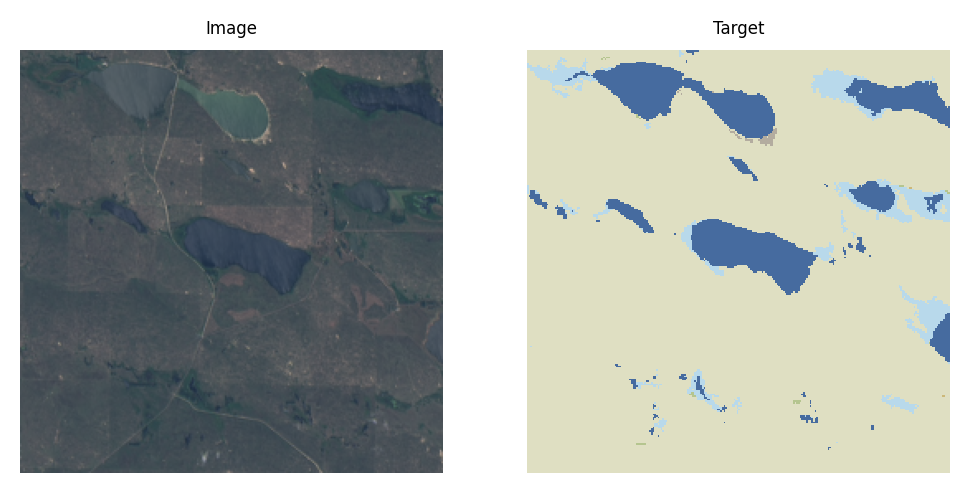

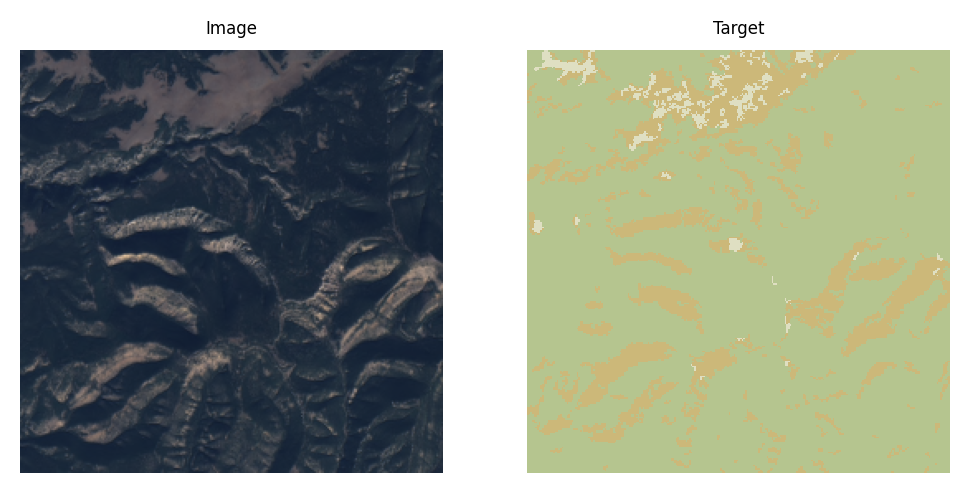

In [ ]:
for image, target in ds_test.take(5):
  display_image_target([image*(3500), target])

Below the new model is fit. 

**NOTE:** the code range for creating the model was pretty much the same as the previous method. The only change was the input datasets, the size of the tensors, and the output_channels are now 9.

In [ ]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = np.ceil(len(ds_val)//BATCH_SIZE//VAL_SUBSPLITS)


model_history = model.fit(ds_train.batch(BATCH_SIZE), epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=ds_val.batch(BATCH_SIZE),
                          callbacks=[model_checkpoint_callback])

Epoch 1/20
268/268 [==============================] - 1394s 5s/step - loss: 1.7518 - accuracy: 0.3818 - val_loss: 1.7493 - val_accuracy: 0.3319
Epoch 2/20
268/268 [==============================] - 248s 922ms/step - loss: 1.4775 - accuracy: 0.4638 - val_loss: 1.5307 - val_accuracy: 0.4419
Epoch 3/20
268/268 [==============================] - 249s 926ms/step - loss: 1.4414 - accuracy: 0.4765 - val_loss: 1.3337 - val_accuracy: 0.4997
Epoch 4/20
268/268 [==============================] - 237s 879ms/step - loss: 1.4227 - accuracy: 0.4822 - val_loss: 1.2966 - val_accuracy: 0.5081
Epoch 5/20
268/268 [==============================] - 229s 848ms/step - loss: 1.4104 - accuracy: 0.4862 - val_loss: 1.2823 - val_accuracy: 0.5124
Epoch 6/20
268/268 [==============================] - 229s 853ms/step - loss: 1.4013 - accuracy: 0.4893 - val_loss: 1.2731 - val_accuracy: 0.5147
Epoch 7/20
268/268 [==============================] - 232s 862ms/step - loss: 1.3941 - accuracy: 0.4919 - val_loss: 1.2679 - v

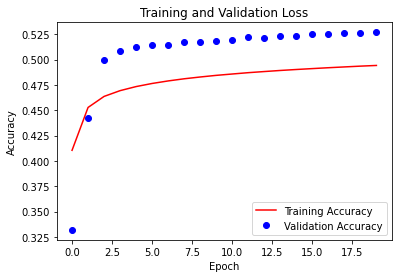

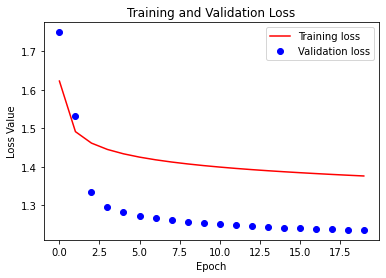

In [ ]:
loss = model_history.history['loss']
val_accuracy= model_history.history['val_accuracy']
val_loss = model_history.history['val_loss']
accuracy= model_history.history['accuracy']


epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, accuracy, 'r', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'bo', label='Validation Accuracy')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.legend()
plt.show()

Above are some plots of how the model did during the training phase (now correctly labeled!). As seen from the first graph the validation accuracy is still better than the training but this time the gap is much less. The gap also starts to close as the epochs increase. If the model trained for more epochs it might have gotten slightly better accuracy but at around 5 it starts to level off. The same analysis is true for the training and validation loss. 

In [ ]:

test_steps = (len(ds_test)//BATCH_SIZE)
if len(ds_test) % BATCH_SIZE != 0:
  test_steps+=1

model.evaluate(ds_test.batch(BATCH_SIZE), steps=test_steps)

34/34 [==============================] - 169s 5s/step - loss: 1.2835 - accuracy: 0.5288


[1.283461332321167, 0.5287846922874451]

As seen from the above results I got 52.88% accuracy, which was a significant improvement to the original attempt. In the conclusion I discuss some other possivle improvements that could be done to maybe get better results.

**HOW TO SAVE STUFF**

In [ ]:
checkpoint_path = '/content/drive/My Drive/ECE471/Homework2/finalWeights.ckpt'
model_path = '/content/drive/My Drive/ECE471/Homework2/finalModel'
model.save_weights(checkpoint_path.format(epoch=0))
model.save(model_path)

INFO:tensorflow:Assets written to: /content/drive/My Drive/ECE471/Homework2/finalModel/assets


Example of how to load in the weights

In [ ]:
model.load_weights(checkpoint_path)

Displaying the predictions

In [ ]:
i = 0
for image, target in ds_test.batch(1).take(134):
  pred_mask = model.predict(image)
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  #print(pred_mask)
  print("currently at index: ", i)
  i += 1
  display_image_target([image[0]*3500, target[0],pred_mask[0]])

Output hidden; open in https://colab.research.google.com to view.

Looked through all the above results there are alot more predictions that look pretty good. There are a few predictions that also came out pretty bad. Some noticable things about the results is that water areas look like they came out nearly perfect! The forest and bare areas came out pretty decent as well. The built areas (red colors) came about pretty bad and almost never were correctly identified.

In [ ]:
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

Now lets takes a look at some statistics!

Below I create a confusion matrix based on the true and predicted target pixels.

In [ ]:
trueTargets = []
predictedTargest = []
for image, target in ds_test.batch(1).take(134):
  pred_mask = model.predict(image)
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  #print(pred_mask)
  trueTargets.append(target[0])
  predictedTargest.append(pred_mask[0])
  #display_image_target([image[0]*3500, target[0],pred_mask[0]])

trueTargets = np.array(trueTargets)
predictedTargest = np.array(predictedTargest)

In [ ]:
predictedTargest = np.reshape(predictedTargest[:,:,:,0],-1)


In [ ]:
trueTargets = np.reshape(trueTargets[:,:,:,0],-1)

In [ ]:
confusionMatrix = confusion_matrix(trueTargets,predictedTargest)

In [ ]:
confusionMatrix.shape

(9, 9)

In [ ]:
confusionMatrix

array([[ 137514,       0,     297,      56,   24995,    2340,    1923,
            321,       9],
       [      0,       0,       0,       0,       0,       0,       0,
              0,       0],
       [   5302,       4,    9256,    4120,  162633,  108477,  106932,
          66295,      85],
       [   1054,       0,     481,   51173,    2611,    6918,    3083,
           4232,       0],
       [   3818,       0,    2529,    2305, 1622417,  153991,   94228,
         153993,     140],
       [   3426,       0,    1535,   11094,  204850, 1536171,  460627,
          93457,      17],
       [   1325,       0,    1203,    1678,  257024,  285911,  893462,
         202314,      34],
       [   2835,       0,    4083,     416,  461031,  201464,  480542,
         393573,     315],
       [   6702,       0,    2058,    2681,  419406,   18992,   52862,
          47076,     128]])

In [ ]:
waterAccurary = (confusionMatrix[0][0]/np.sum(confusionMatrix[0]))*100
snowAccurary = (confusionMatrix[1][1]/np.sum(confusionMatrix[1]))*100
builtAreaAccurary = (confusionMatrix[2][2]/np.sum(confusionMatrix[2]))*100
bareAccurary = (confusionMatrix[3][3]/np.sum(confusionMatrix[3]))*100
forestAccurary = (confusionMatrix[4][4]/np.sum(confusionMatrix[4]))*100
scrubAccurary = (confusionMatrix[5][5]/np.sum(confusionMatrix[5]))*100
grassAccurary = (confusionMatrix[6][6]/np.sum(confusionMatrix[6]))*100
cropsAccurary = (confusionMatrix[7][7]/np.sum(confusionMatrix[7]))*100
wetlandsAccurary = (confusionMatrix[8][8]/np.sum(confusionMatrix[8]))*100

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in long_scalars
  


In [ ]:
categories = ["water", "snow/ice", "built area", "bare", "forest", "shrub/scrub", "grass", "crops", "wetlands"]
accuracyList = [waterAccurary,snowAccurary,builtAreaAccurary,bareAccurary,forestAccurary,scrubAccurary,grassAccurary,cropsAccurary,wetlandsAccurary ]

In [ ]:
accTable = np.asarray((categories, accuracyList)).T
accTable

array([['water', '82.11997252993342'],
       ['snow/ice', 'nan'],
       ['built area', '1.9986871199557765'],
       ['bare', '73.57516678168852'],
       ['forest', '79.7875599789714'],
       ['shrub/scrub', '66.46704255018115'],
       ['grass', '54.38153663742863'],
       ['crops', '25.486204062919498'],
       ['wetlands', '0.023276747801893056']], dtype='<U20')

**WOW! Look at these accuracies!**

As seen from the images before these accuracies line up with what I thought. In this specific test data set there were no snow/ice pixels there was no accuracy. Water, bare, forest, and scrub pixels ended up having pretty good accuracies. Build areas and wetlands had absolutly terrible accuracy. I think the reason that these had pretty bad accuracies has a combination of the little frequency of pixels for these classes and the similarity to the other classes. Looking at the confusion matrix (see below) these two classes often got mislabeled as forest, grass, and scrub pixels. 


In [ ]:
import seaborn as sns

This function was used to plot the confusion matrix

In [ ]:
def plotCM(ds_test):
  trueTargets = []
  predictedTargest = []
  for image, target in ds_test.batch(1).take(len(ds_test)):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    #print(pred_mask)
    trueTargets.append(target[0])
    predictedTargest.append(pred_mask[0])

  trueTargets = np.array(trueTargets)
  predictedTargest = np.array(predictedTargest)

  predictedTargest = np.reshape(predictedTargest[:,:,:,0],-1)
  trueTargets = np.reshape(trueTargets[:,:,:,0],-1)
  confusionMatrix = confusion_matrix(trueTargets,predictedTargest)

  categories = ["water", "snow/ice", "built area", "bare", "forest", "shrub/scrub", "grass", "crops", "wetlands"]

  df_cm = pd.DataFrame(confusionMatrix, index=categories, columns=categories)

  plt.figure(figsize=(20,20))
  sns.heatmap(df_cm, annot=True, cmap='Blues')
  plt.ylabel("True Target")
  plt.xlabel("Predicted")
  plt.title("Confusion Matrix")

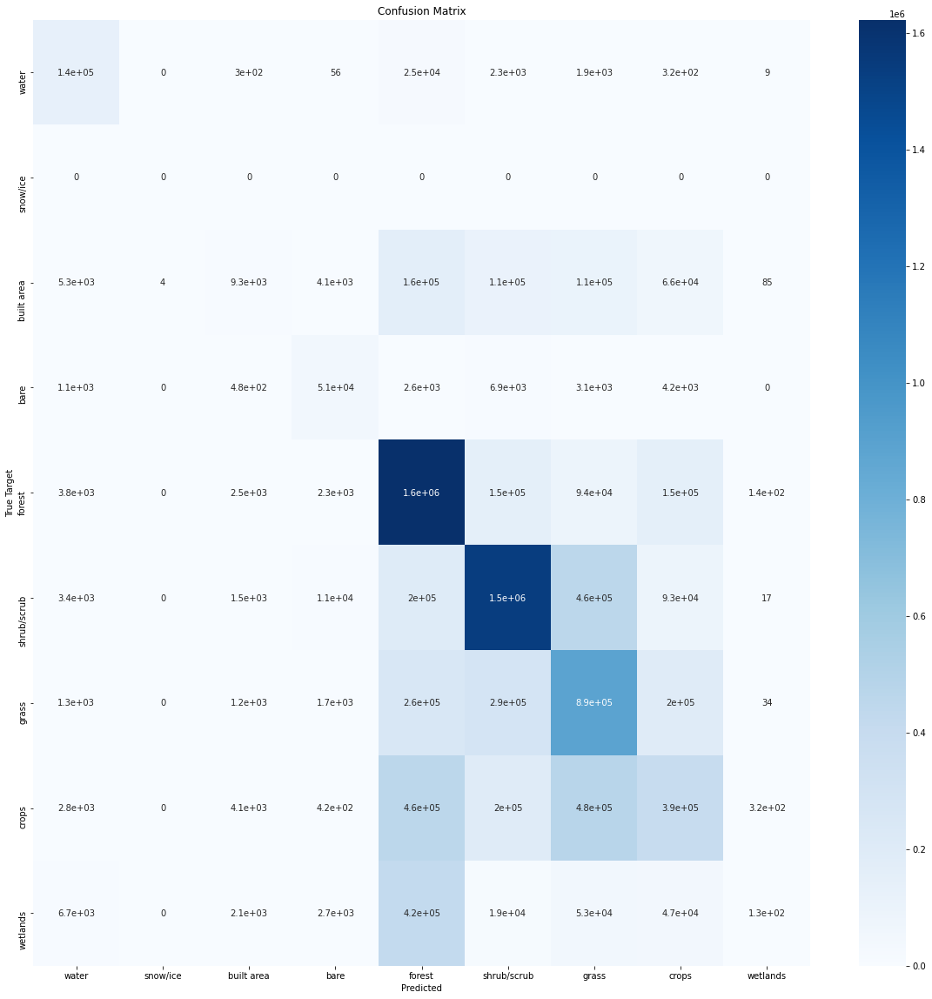

In [ ]:
plotCM(ds_test)

# **Everything needed to test the program**

In this section I have included all the code blocks needed to run in order to test sample images. All you need to include is include a list of images and the weight and model path in your drive. Please do this in the way see in the second codeblock. In order for this to work please pass in a list of at least two images. If you only have one image please pass in the same image twice in a list. 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
weight_path = '/content/drive/My Drive/ECE471/Homework2/finalWeights.ckpt'
model_path = '/content/drive/My Drive/ECE471/Homework2/finalModel'

images = [samples[32], samples[666]]

In [ ]:
!pip install rasterio!pip install rasterio

In [ ]:
# base imports
from glob import glob
import itertools
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
from osgeo import gdal
import pandas as pd
import rasterio
from random import shuffle
import sklearn.metrics as skmetrics
%tensorflow_version 2.x
import tensorflow as tf

# check that a GPU is enabled
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

In [ ]:
# read in the CSV file that contains file links to the entire dataset
dataset_file = 'https://storage.googleapis.com/naip_public/dataset.csv'
df = pd.read_csv(dataset_file)
print(len(df))
df.head(5)

In [ ]:
# use these as base directories for reading the dataset from cloud storage
image_base = 'https://storage.googleapis.com/naip_public/images'
target_base = 'https://storage.googleapis.com/naip_public/targets_v2'

In [ ]:
# load in file links from cloud storage
samples = list()
for idx, row in df.iterrows():
  image_file = os.path.join(image_base, row['images'])
  target_file = os.path.join(target_base, row['targets'])

  samples.append((image_file, target_file))

In [ ]:
# NLCD color scheme
nlcd_color_mapping = {
    11: (70, 107, 159),
    12: (209, 222, 248),
    #21: (222, 197, 255),
    #22: (217, 146, 130),
    23: (235, 0, 0),
    #24: (171, 0, 0),
    31: (179, 172, 159),
    #41: (104, 171, 95),
    #42: (28, 95, 44),
    43: (181, 197, 143),
    52: (204, 184, 121),
    71: (223, 223, 194),
    #81: (220, 217, 57),
    82: (171, 108, 40),
    90: (184, 217, 235),
    #95: (108, 159, 184),
}

# NLCD class mapping
nlcd_name_mapping = {
    11: 'Open Water',
    12: 'Perennial Ice/Snow',
    #21: 'Developed, Open Space',
    #22: 'Developed, Low Intensity',
    23: 'Developed, Medium Intensity',
    #24: 'Developed, High Intensity',
    31: 'Barren Land',
    #41: 'Deciduous Forest',
    #42: 'Evergreen Forest',
    43: 'Mixed Forest',
    52: 'Shrub/Scrub',
    71: 'Grassland/Herbaceous',
    #81: 'Pasture/Hay',
    82: 'Cultivated Crops',
    90: 'Woody Wetlands',
    #95: 'Emergent Herbaceous Wetlands',
}

In [ ]:
# build a matplotlib colormap so we can visualize this data
colors = list()
for idx, class_val in enumerate(nlcd_color_mapping.keys()):
  red, green, blue = nlcd_color_mapping[class_val]

  color_vec = np.array([red/255, green/255, blue/255])
  colors.append(color_vec)

colors = np.stack(colors)
cmap = matplotlib.colors.ListedColormap(colors=colors, N=len(colors))

bounds = list(range(len(colors)))
norm = matplotlib.colors.BoundaryNorm(bounds, len(colors))

In [ ]:
# write a function so that we can display image/target/predictions
def display_image_target(display_list):
  plt.figure(dpi=200)
  title = ['Image', 'Target', 'Prediction']

  for idx, disp in enumerate(display_list):
    plt.subplot(1, len(display_list), idx+1)
    plt.title(title[idx], fontsize=6)
    plt.axis('off')

    if title[idx] == 'Image':
      arr = disp.numpy()
      rgb = np.stack([arr[:, :, 3], arr[:, :, 2], arr[:, :, 1]], axis=-1) / 3000.0
      plt.imshow(rgb)

    elif title[idx] == 'Target':
      tgt = disp.numpy().squeeze()
      plt.imshow(tgt, interpolation='none', norm=norm, cmap=cmap)

    elif title[idx] == 'Prediction':
      #pred = np.argmax(disp, axis=-1) # argmax across probabilities to get class outputs
      pred = disp.numpy().squeeze()
      plt.imshow(pred, interpolation='none', norm=norm, cmap=cmap)

  plt.show()
  plt.close()

In [ ]:
def read_sample(data_path: str) -> tuple:
  path = data_path.numpy()
  image_path, target_path = path[0].decode('utf-8'), path[1].decode('utf-8')

  with rasterio.open(image_path) as src:
    img = np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint16)
    img = img[:,:,:-2] #added this to get rid of the alpha band and cloud mask

  with rasterio.open(target_path) as src:
    tgt = np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint8)
    tgt[tgt == 21] = 23
    tgt[tgt == 22] = 23
    tgt[tgt == 24] = 23
    tgt[tgt == 41] = 43
    tgt[tgt == 42] = 43
    tgt[tgt == 81] = 71
    tgt[tgt == 95] = 90

  tgt_out = np.zeros(tgt.shape, dtype=np.uint8)
  for class_val, nlcd_val in enumerate(nlcd_color_mapping.keys()):
    tgt_out[tgt == nlcd_val] = class_val

  return (img, tgt_out)

In [ ]:
@tf.function
def tf_read_sample(data_path: str) -> dict:
  # wrap custom dataloadeer into tensorflow
  [image, target] = tf.py_function(read_sample, [data_path], [tf.uint16, tf.uint8])

  # explicitly set tensor shapes
  image.set_shape((256, 256, 8))
  target.set_shape((256, 256, 1))

  return {'image': image, 'target': target}

In [ ]:
@tf.function
def load_sample(sample: dict) -> tuple:
  # convert to tf image
  image = tf.image.resize(sample['image'], (256, 256))
  target = tf.image.resize(sample['target'], (256, 256))

  # cast to proper data types
  image = tf.cast(image/(3500), tf.float32)
  target = tf.cast(target, tf.uint8)

  return image, target

In [ ]:
def createDs(samples):
  # create tensorflow dataset from file links
  ds = tf.data.Dataset.from_tensor_slices(samples)

  # read in image/target pairs
  ds = ds.map(tf_read_sample, num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # read in as tensors
  ds = ds.map(load_sample, num_parallel_calls=tf.data.experimental.AUTOTUNE)
  return ds

Just in case, you might not need all of these

In [ ]:
import tensorflow_datasets as tfds
from tensorflow import keras
from IPython.display import clear_output
import matplotlib.pyplot as plt
from tensorflow.keras.layers import UpSampling2D, Input, Concatenate
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


Below is the function to get the predictions based on input images and the model and weight files paths. Please refer to the start of this section for the proper format for each of those.

In [ ]:
def customPrediction(model_path,weight_path,images):
  model = keras.models.load_model(model_path)
  model.load_weights(weight_path)
  imageDS = createDs(images)
  for image, target in imageDS.batch(1).take(len(imageDS)):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    #print(pred_mask)
    display_image_target([image[0]*3500, target[0],pred_mask[0]])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


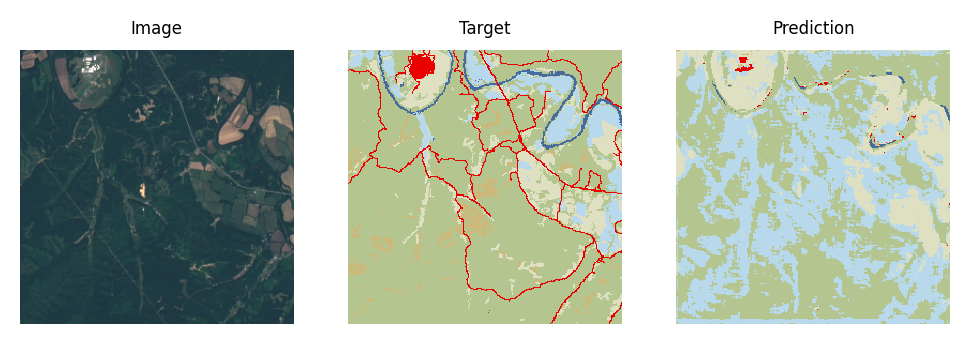

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


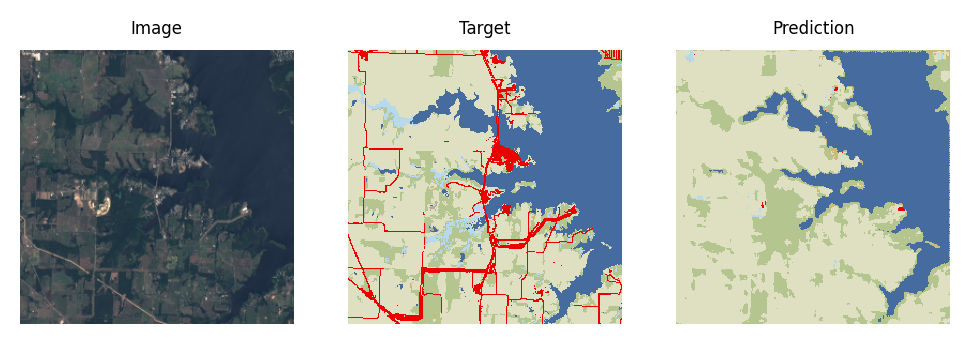

In [ ]:
customPrediction(model_path,weight_path,images)

# **Conclusion**

Overall, this project was very fun and I learned alot about it. I came into this project with no tensorflow experience. I had taken a few ML and AI classes before, but those all used sklearn. At first it was stressful to do this project since I had no idea what I was doing with tensorflow, but after following some tutorials I got a pretty good understanding of the basics and was able to create different model architectures. 

As discussed throughout the notebook there were several improvements that I had made through different attempts. I was pretty happy with my end accuracy of 53% because this was much higher than my original 20% that I was getting with some of my first attempts. 

Some improvements that might have helped with getting better accuracies are rotating the images, using more epochs, filter out invalid pixels, and experimenting with other tensorflow libraries. I wanted to try rotating all the images by 90 degrees but never got around to trying this because I did not have too much time and this would take much longer to run (12+ hours). Maybe sometime in the future I can come back to this and experiment with rotating each of the images. 

**Acknowledgments**

I would like to thank Allister Liu, Amy Leong, and Paul Cucchiara for working with me to figure out how to use tensorflow and following some tutorials. Additionally, I would like to thank Derek Lee for helping me work through some bugs and issues I ran into when working with tensorflow. I would also like to thank Mark Koszykowski for giving me the idea of grouping the classes. Finally, I would like to thank the Professor, Krishna Karra, for giving me some tips on how to improve my accuracy, such as fixing the way I normalized, splitting methods, band removal, and filtering by valid pixels. 